# Compare the v3.4 recalibrated SDSS Stripe82 catalog 
# and the CFIS catalog from Stephen Gwyn

[Link to helper tools](#dataTools) 

[Link to data reading](#dataReading) 

[Link to data analysis](#dataAnalysis) 

In [1]:
%matplotlib inline
from astropy.table import Table
from astropy.coordinates import SkyCoord
from astropy import units as u
from astropy.table import hstack
import matplotlib.pyplot as plt 
import numpy as np
from astroML.plotting import hist
# for astroML installation see https://www.astroml.org/user_guide/installation.html

In [2]:
## automatically reload any modules read below that might have changed (e.g. plots)
%load_ext autoreload
%autoreload 2
# importing ZI tools: 
import ZItools as zit
# importing Karun's tools: 
import KTtools as ktt

<a id='dataTools'></a>

### Helper Tools

In [3]:
# robust standard deviation
def sigG(arr):
    return 0.741*(np.quantile(arr, 0.75)-np.quantile(arr, 0.25))

In [4]:
def doOneColor(d, kw):
    print('=========== WORKING ON:', kw['Ystr'], '===================')
    xVec = d[kw['Xstr']]
    yVec = d[kw['Ystr']]
    # 
    xBin, nPts, medianBin, sigGbin = zit.fitMedians(xVec, yVec, 0.5, 3.1, 52, 0)
    fig,ax = plt.subplots(1,1,figsize=(8,6))
    ax.scatter(xVec, yVec, s=0.01, c='blue')
    ax.scatter(xBin, medianBin, s=5.2, c='yellow')
    ax.set_xlim(0.4,3.2)
    ax.set_ylim(-0.5,0.5)
    ax.set_xlabel(kw['Xstr'])
    ax.set_ylabel(kw['Ystr'])
    d['colorfit'] = np.interp(xVec, xBin, medianBin)
    d['colorresid'] = d[kw['Ystr']] - d['colorfit'] 
    goodC = d[np.abs(d['colorresid'])<0.3]
    
    ### plots 
    # RA
    print(' stats for RA binning medians:')
    plotNameRoot = kw['plotNameRoot'] + kw['Ystr']
    plotName = plotNameRoot + '_RA.png'
    Ylabel =kw['Ystr'] + ' residuals'
    kwOC = {"Xstr":'raW', "Xmin":-52, "Xmax":45, "Xlabel":'R.A. (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-51.5, "XmaxBin":45, "nBin":56, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    # Dec
    print('-----------')
    print(' stats for Dec binning medians:')
    plotName = plotNameRoot + '_Dec.png'
    kwOC = {"Xstr":'dec', "Xmin":-0.5, "Xmax":1.3, "Xlabel":'Declination (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-0.45, "XmaxBin":1.26, "nBin":52, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    Ylabel = 'residuals for ($u_{SDSS}$ - $u_{CFIS}$)'
    kwOC = {"Xstr":'dec', "Xmin":-0.5, "Xmax":1.3, "Xlabel":'Declination (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-0.45, "XmaxBin":1.26, "nBin":52, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":0.05}
    color = 'colorresid' 
    kwOC["Ystr"] = color 
    kwOC["plotName"] = 'colorResidCFISug_Dec_Hess.png'  
    kwOC["nBinX"] = 55
    kwOC["nBinY"] = 25
    kwOC["cmap"] = 'plasma'
    ktt.plotdelMagBW_KT(sdssCFISug, kwOC)
    
    
    print('made plot', plotName)
    # r SDSS
    print('-----------')
    print(' stats for SDSS u binning medians:')
    plotName = plotNameRoot + '_umag.png'    
    kwOC = {"Xstr":'u_mMed', "Xmin":15.2, "Xmax":22.5, "Xlabel":'SDSS u (mag)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":16, "XmaxBin":22, "nBin":55, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    print('------------------------------------------------------------------')

def doOneColorRA(d, kw):
    print('=========== WORKING ON:', kw['Ystr'], '===================')
    xVec = d[kw['Xstr']]
    yVec = d[kw['Ystr']]
    # 
    xBin, nPts, medianBin, sigGbin = zit.fitMedians(xVec, yVec, 0.5, 3.1, 52, 0)
    fig,ax = plt.subplots(1,1,figsize=(8,6))
    ax.scatter(xVec, yVec, s=0.01, c='blue')
    ax.scatter(xBin, medianBin, s=5.2, c='yellow')
    ax.set_xlim(0.4,3.2)
    ax.set_ylim(-0.5,0.5)
    ax.set_xlabel(kw['Xstr'])
    ax.set_ylabel(kw['Ystr'])
    d['colorfit'] = np.interp(xVec, xBin, medianBin)
    d['colorresid'] = d[kw['Ystr']] - d['colorfit'] 
    goodC = d[np.abs(d['colorresid'])<0.3]
    
    ### plots 
    # RA
    print(' stats for RA binning medians:')
    plotNameRoot = kw['plotNameRoot'] + kw['Ystr']
    plotName = plotNameRoot + '_RA.png'
    Ylabel = 'u band residuals (SDSS vs. CFIS, BP-RP)'
    kwOC = {"Xstr":'raW', "Xmin":-52, "Xmax":62, "Xlabel":'R.A. (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-48, "XmaxBin":45, "nBin":56, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    plotdelMag2(goodC, kwOC, True)
    print('made plot', plotName)   

    
def doOneColorDec(d, kw):
    print('=========== WORKING ON:', kw['Ystr'], '===================')
    xVec = d[kw['Xstr']]
    yVec = d[kw['Ystr']]
    # 
    xBin, nPts, medianBin, sigGbin = zit.fitMedians(xVec, yVec, 0.5, 3.1, 52, 0)
    fig,ax = plt.subplots(1,1,figsize=(8,6))
    ax.scatter(xVec, yVec, s=0.01, c='blue')
    ax.scatter(xBin, medianBin, s=5.2, c='yellow')
    ax.set_xlim(0.4,3.2)
    ax.set_ylim(-0.5,0.5)
    ax.set_xlabel(kw['Xstr'])
    ax.set_ylabel(kw['Ystr'])
    d['colorfit'] = np.interp(xVec, xBin, medianBin)
    d['colorresid'] = d[kw['Ystr']] - d['colorfit'] 
    goodC = d[np.abs(d['colorresid'])<0.3]
    
    ### plots 
    # Dec
    print('-----------')
    print(' stats for Dec binning medians:')
    plotNameRoot = kw['plotNameRoot'] + kw['Ystr']
    plotName = plotNameRoot + '_Dec.png'
    Ylabel = 'u band residuals (SDSS vs. CFIS, BP-RP)'
    kwOC = {"Xstr":'dec', "Xmin":-1.3, "Xmax":1.3, "Xlabel":'Declination (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-0.45, "XmaxBin":1.26, "nBin":35, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    plotdelMag2(goodC, kwOC, False)
    print('made plot', plotName)
 



In [5]:
## a horrible hack to compare CFIS and Gaia results for the u band
def plotdelMag2(d, kw, RA=True):
 
    print('medianAll:', np.median(d[kw['Ystr']]), 'std.dev.All:', sigG(d[kw['Ystr']]))
    print('N=', np.size(d[kw['Ystr']]), 'min=', np.min(d[kw['Ystr']]), 'max=', np.max(d[kw['Ystr']]))

    fig, ax = plt.subplots(figsize=(12, 8))
    ax.scatter(d[kw['Xstr']], d[kw['Ystr']], s=kw['symbSize'], c='black') 
    # binning
    xBinM, nPtsM, medianBinM, sigGbinM = zit.fitMedians(d[kw['Xstr']], \
                                         d[kw['Ystr']], kw['XminBin'], kw['XmaxBin'], kw['nBin'], 1)
    # plotting
    if (kw['offset'] >= 0):
        xL = np.linspace(kw['XminBin'], kw['XmaxBin'])
        ax.plot(xL, 0*xL, '-', c='red', linewidth=3)
        ax.plot(xL, 0*xL+kw['offset'], '--', c='red', linewidth=3)
        ax.plot(xL, 0*xL-kw['offset'], '--', c='red', linewidth=3)
    if (0):
        ax.scatter(xBinM, medianBinM, s=30.0, c='black', alpha=0.8)
        ax.scatter(xBinM, medianBinM, s=15.0, c='yellow', alpha=0.3)
    #
    TwoSigP = medianBinM + kw['Nsigma']*sigGbinM
    TwoSigM = medianBinM - kw['Nsigma']*sigGbinM 
    ax.plot(xBinM, TwoSigP, c='yellow', linewidth=3)
    ax.plot(xBinM, TwoSigM, c='yellow', linewidth=3)
    #
    rmsBin = np.sqrt(nPtsM) / np.sqrt(np.pi/2) * sigGbinM
    rmsP = medianBinM + rmsBin
    rmsM = medianBinM - rmsBin
    ax.plot(xBinM, rmsP, c='cyan', linewidth=3)
    ax.plot(xBinM, rmsM, c='cyan', linewidth=3)
    # 
    if (RA):
       # read back 
        zpRAgrid, zpRA = np.loadtxt('ZPcorrectionsRA_Gaia_uband_v3.2.dat')  
        ax.plot(zpRAgrid, zpRA, c='blue', linewidth=3)
        here = np.interp(xBinM, zpRAgrid, zpRA) - medianBinM 
        print(np.min(here), np.max(here), sigG(here))
    else:
        zpDecgrid, zpDec = np.loadtxt('ZPcorrectionsDec_Gaia_uband_v3.2.dat')   
        ax.plot(zpDecgrid, zpDec, c='blue', linewidth=3)
        here = np.interp(xBinM, zpDecgrid, zpDec) - medianBinM 
        print(np.min(here), np.max(here), sigG(here))



    ax.set_xlabel(kw['Xlabel'], fontsize=22)
    ax.set_ylabel(kw['Ylabel'], fontsize=22)
    ax.set_xlim(kw['Xmin'], kw['Xmax'])
    ax.set_ylim(kw['Ymin'], kw['Ymax'])
    plt.xticks(fontsize=22)
    plt.yticks(fontsize=22)
    plt.savefig(kw['plotName'], dpi=600)
    print('saved plot as:', kw['plotName']) 
    
    
    plt.show()
    return

In [6]:
# both new and old files use identical data structure
colnamesSDSS = ['calib_fla', 'ra', 'dec', 'raRMS', 'decRMS', 'nEpochs', 'AR_val', 
                'u_Nobs', 'u_mMed', 'u_mMean', 'u_mErr', 'u_rms_scatt', 'u_chi2',
                'g_Nobs', 'g_mMed', 'g_mMean', 'g_mErr', 'g_rms_scatt', 'g_chi2',
                'r_Nobs', 'r_mMed', 'r_mMean', 'r_mErr', 'r_rms_scatt', 'r_chi2',
                'i_Nobs', 'i_mMed', 'i_mMean', 'i_mErr', 'i_rms_scatt', 'i_chi2',
                'z_Nobs', 'z_mMed', 'z_mMean', 'z_mErr', 'z_rms_scatt', 'z_chi2']

### code for generating new quantities, such as dra, ddec, colors, differences in mags, etc
def derivedColumns(matches):
    matches['dra'] = (matches['ra_sdss']-matches['ra_cfis'])*3600
    matches['ddec'] = (matches['dec_sdss']-matches['dec_cfis'])*3600
    ra = matches['ra_sdss'] 
    matches['raW'] = np.where(ra > 180, ra-360, ra) 
    matches['dupsf'] = matches['u_mMed'] - matches['upsf'] 
    matches['duauto'] = matches['u_mMed'] - matches['uauto'] 
    matches['ug'] = matches['u_mMed'] - matches['g_mMed']
    matches['gr'] = matches['g_mMed'] - matches['r_mMed']
    matches['ri'] = matches['r_mMed'] - matches['i_mMed']
    matches['gi'] = matches['g_mMed'] - matches['i_mMed']
    matches['iz'] = matches['i_mMed'] - matches['z_mMed']
    return

<a id='dataReading'></a>

### Define paths and catalogs 

In [7]:
ZIdataDir = "/Users/ivezic/Work/Science/CalibrationV2/SDSS_SSC/Data"
# original analysis
# SDSScatalog = ZIdataDir + "/" + "stripe82calibStars_v3.2.dat" 
# final analysis
# SDSScatalog = ZIdataDir + "/" + "stripe82calibStars_v3.2_noheader_final.dat"
SDSScatalog = ZIdataDir + "/" + "stripe82calibStars_v3.4.dat"
# CFIS catalog (from Stephen Gwyn)
CFIScatalog = ZIdataDir + "/" + "cfis_stripe82.dat" 
colnamesCFIS = ['ra', 'dec', 'upsf', 'uauto', 'upsfErr', 'uautoErr', 'sg']
cfis = Table.read(CFIScatalog, format='ascii', names=colnamesCFIS) 

In [8]:
sdss = Table.read(SDSScatalog, format='ascii', names=colnamesSDSS)

In [9]:
sdss_coords = SkyCoord(ra = sdss['ra']*u.degree, dec= sdss['dec']*u.degree) 
cfis_coords = SkyCoord(ra = cfis['ra']*u.degree, dec= cfis['dec']*u.degree) 

# this is matching cfis to sdss, so that indices are into sdss catalog
# makes sense in this case since the sdss catalog is bigger than gaia
idx, d2d, d3d = cfis_coords.match_to_catalog_sky(sdss_coords)  

# object separation is an object with units, 
# I add that as a column so that one can 
# select based on separation to the nearest matching object
sdssCFISall = hstack([cfis, sdss[idx]], table_names = ['cfis', 'sdss'])
sdssCFISall['sep_2d_arcsec'] = d2d.arcsec

In [10]:
print(np.min(cfis['ra']), np.max(cfis['ra']))

0.0036244 359.8723208


In [11]:
sdssCFIS = sdssCFISall[sdssCFISall['sep_2d_arcsec']<1.0]
print(np.size(sdssCFISall), np.size(sdssCFIS))

964530 324786


In [12]:
derivedColumns(sdssCFIS)

In [13]:
sdssCFIS['ra'] = sdssCFIS['ra_sdss']
sdssCFIS['dec'] = sdssCFIS['dec_sdss']
sdssCFIS['duCFIS'] = sdssCFIS['upsf'] - sdssCFIS['uauto']

In [14]:
sdssCFISug = sdssCFIS[(sdssCFIS['ug']>1.0)&(sdssCFIS['ug']<2.1)]
sdssCFISbright = sdssCFISug[sdssCFISug['r_mMed']<20]
print(np.size(sdssCFIS), np.size(sdssCFISug), np.size(sdssCFISbright))

324786 184422 151599


=========== WORKING ON: dupsf ===================
 stats for RA binning medians:
medianAll: 0.0010800000000012744 std.dev.All: 0.04526028000000252
N= 179030 min= -0.29999999999999893 max= 0.2999200000000026
median: -0.00486000000000094 std.dev: 0.016763841600423386
saved plot as: colorResidCFISug_dupsf_RA.png


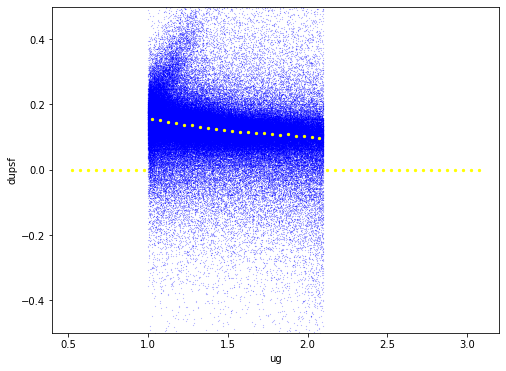

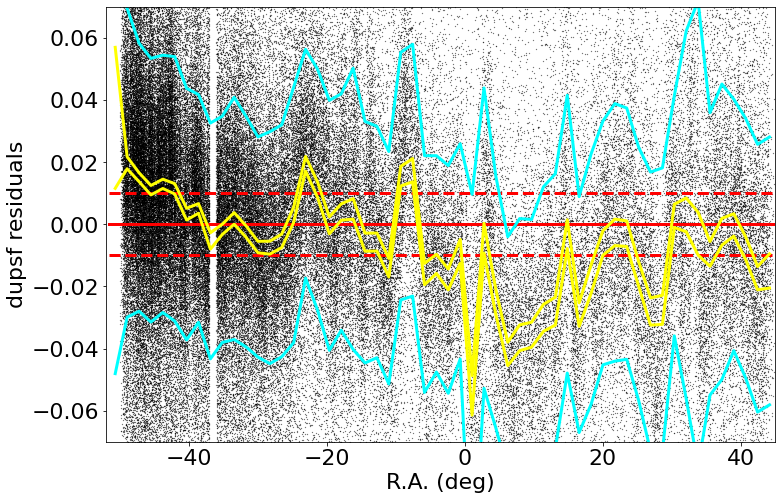

made plot colorResidCFISug_dupsf_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.0010800000000012744 std.dev.All: 0.04526028000000252
N= 179030 min= -0.29999999999999893 max= 0.2999200000000026
median: -4.500000000171728e-05 std.dev: 0.005658799279224225
saved plot as: colorResidCFISug_dupsf_Dec.png


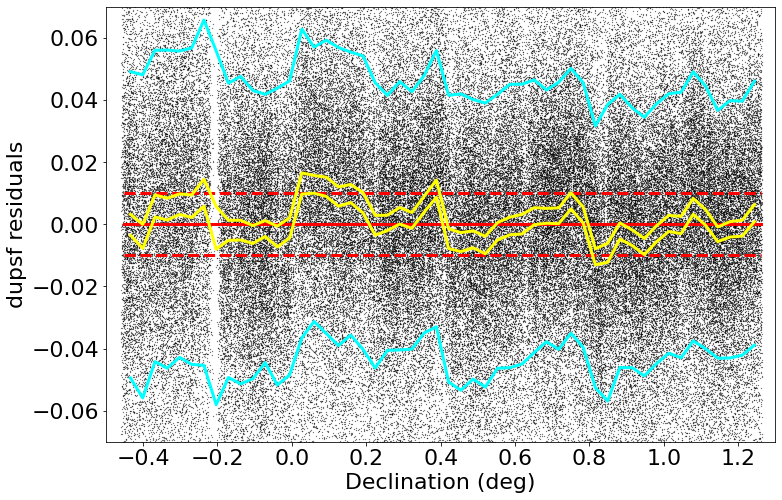

medianAll: 0.0010599999999977225 std.dev.All: 0.047246160000000134
N= 184422 min= -4.185480000000002 max= 2.271759999999999
median: 0.0007399999999996368 std.dev: 0.005964395378528205
saved plot as: colorResidCFISug_Dec_Hess.png


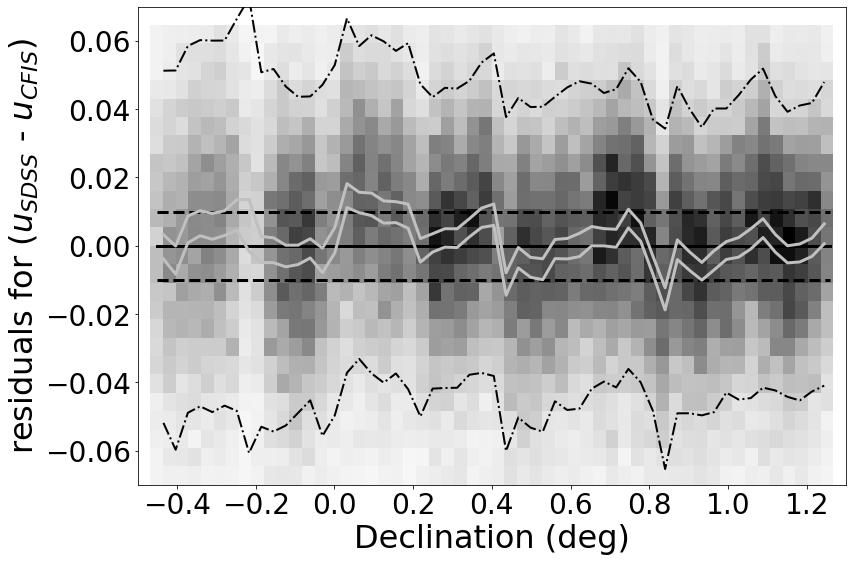

made plot colorResidCFISug_dupsf_Dec.png
-----------
 stats for SDSS u binning medians:
medianAll: 0.0010800000000012744 std.dev.All: 0.04526028000000252
N= 179030 min= -0.29999999999999893 max= 0.2999200000000026
median: 0.004180000000000184 std.dev: 0.009610158468262967
saved plot as: colorResidCFISug_dupsf_umag.png


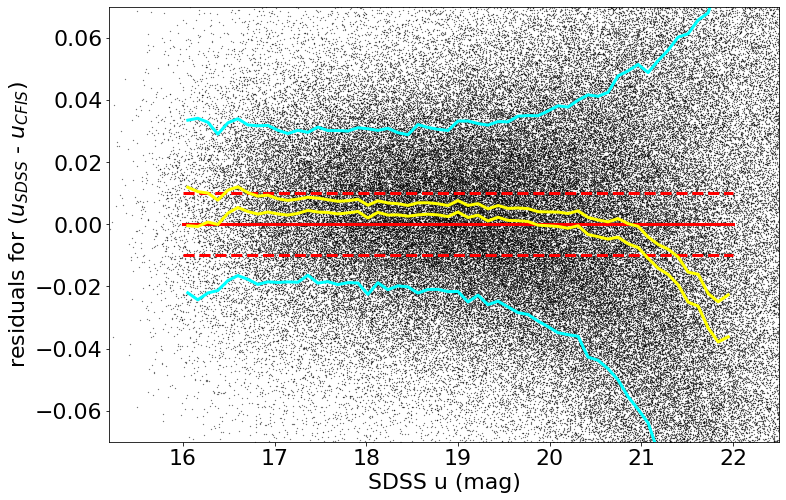

made plot colorResidCFISug_dupsf_umag.png
------------------------------------------------------------------
=========== WORKING ON: duauto ===================
 stats for RA binning medians:
medianAll: 0.0011110000000024225 std.dev.All: 0.050929300499998886
N= 176744 min= -0.29996799999999996 max= 0.2999949999999969
median: -0.0024174999999998954 std.dev: 0.01564830424418805
saved plot as: colorResidCFISug_duauto_RA.png


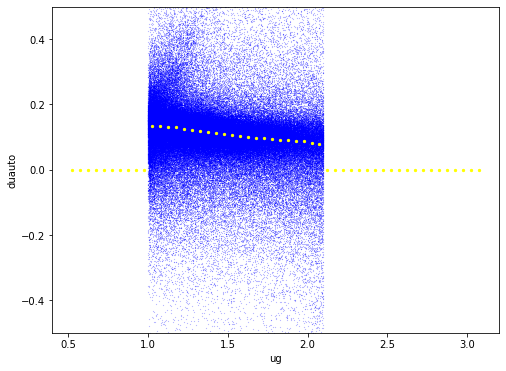

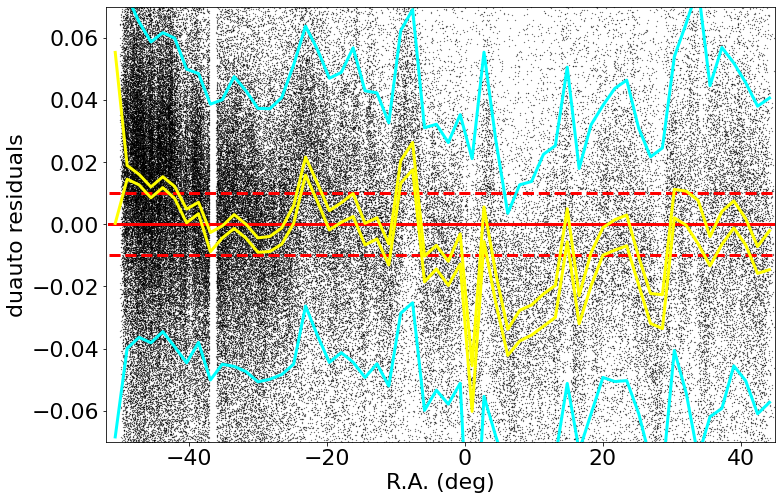

made plot colorResidCFISug_duauto_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.0011110000000024225 std.dev.All: 0.050929300499998886
N= 176744 min= -0.29996799999999996 max= 0.2999949999999969
median: 0.0008432500000004547 std.dev: 0.005326821471746928
saved plot as: colorResidCFISug_duauto_Dec.png


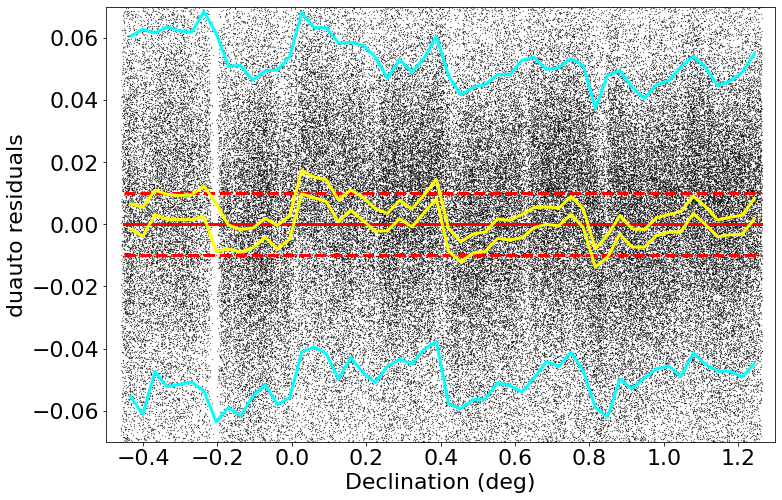

medianAll: 0.0009519999999988912 std.dev.All: 0.05427732375000101
N= 184422 min= -3.339611999999998 max= 3.964607000000001
median: 0.0012594999999997608 std.dev: 0.00564270777275946
saved plot as: colorResidCFISug_Dec_Hess.png


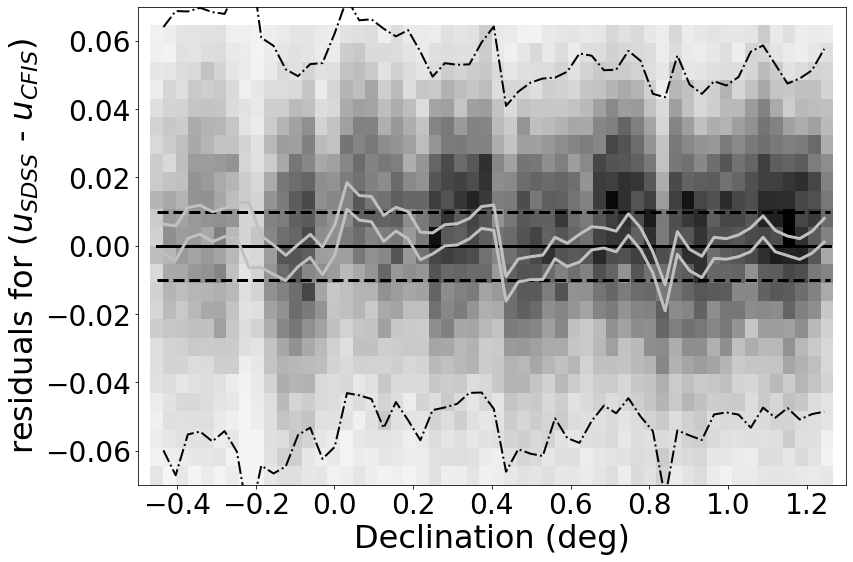

made plot colorResidCFISug_duauto_Dec.png
-----------
 stats for SDSS u binning medians:
medianAll: 0.0011110000000024225 std.dev.All: 0.050929300499998886
N= 176744 min= -0.29996799999999996 max= 0.2999949999999969
median: 0.006159999999999027 std.dev: 0.01716887537632956
saved plot as: colorResidCFISug_duauto_umag.png


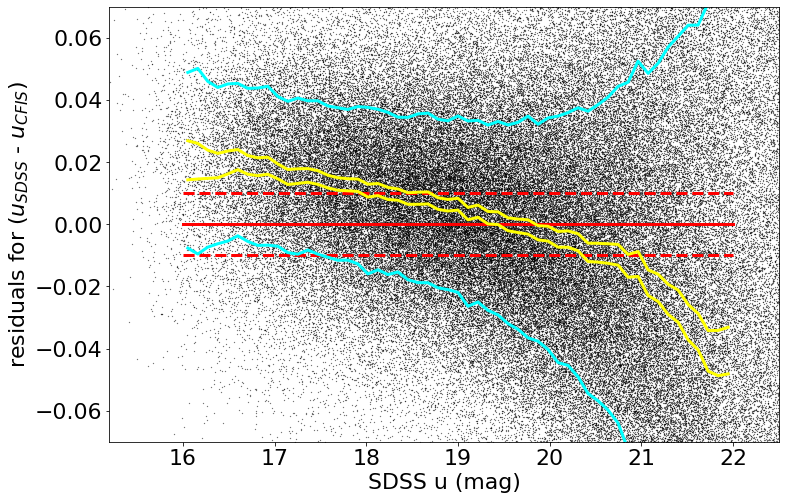

made plot colorResidCFISug_duauto_umag.png
------------------------------------------------------------------
=========== WORKING ON: dra ===================
 stats for RA binning medians:
medianAll: 0.0007992000282683693 std.dev.All: 0.07736573526284037
N= 180910 min= -0.29999519999728347 max= 0.29992319982557064
median: -0.016399799968468312 std.dev: 0.023694544540778344
saved plot as: colorResidCFISug_dra_RA.png


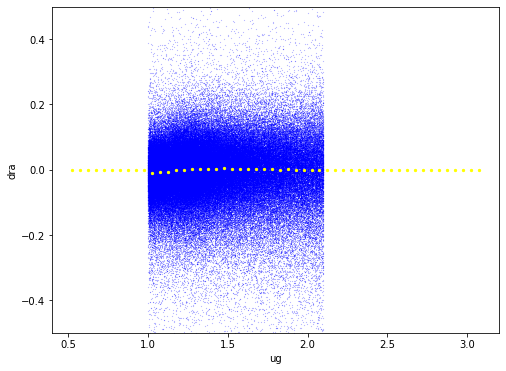

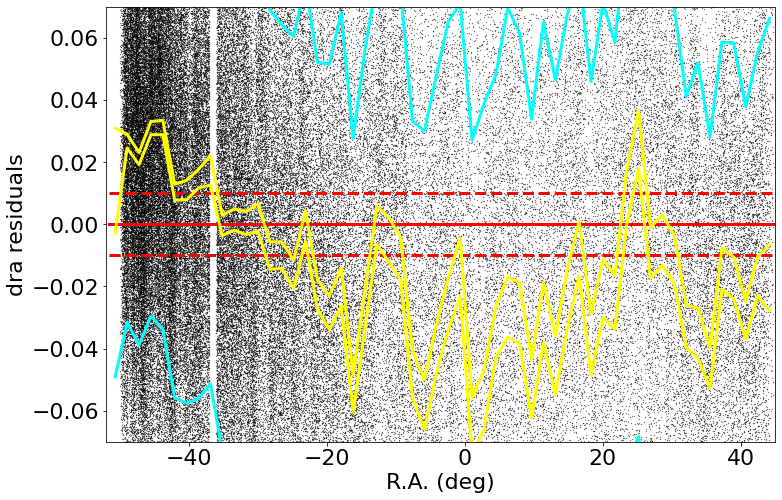

made plot colorResidCFISug_dra_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.0007992000282683693 std.dev.All: 0.07736573526284037
N= 180910 min= -0.29999519999728347 max= 0.29992319982557064
median: 0.0005057999115862842 std.dev: 0.004690881734533606
saved plot as: colorResidCFISug_dra_Dec.png


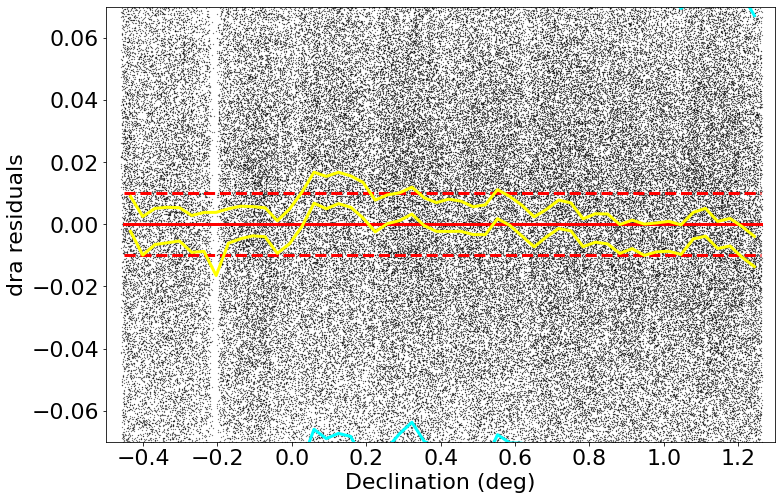

medianAll: -0.00012960001113880007 std.dev.All: 0.07944512942246429
N= 184422 min= -0.9747431998156912 max= 0.9845999999697597
median: -0.001058400033343791 std.dev: 0.0047562220157866195
saved plot as: colorResidCFISug_Dec_Hess.png


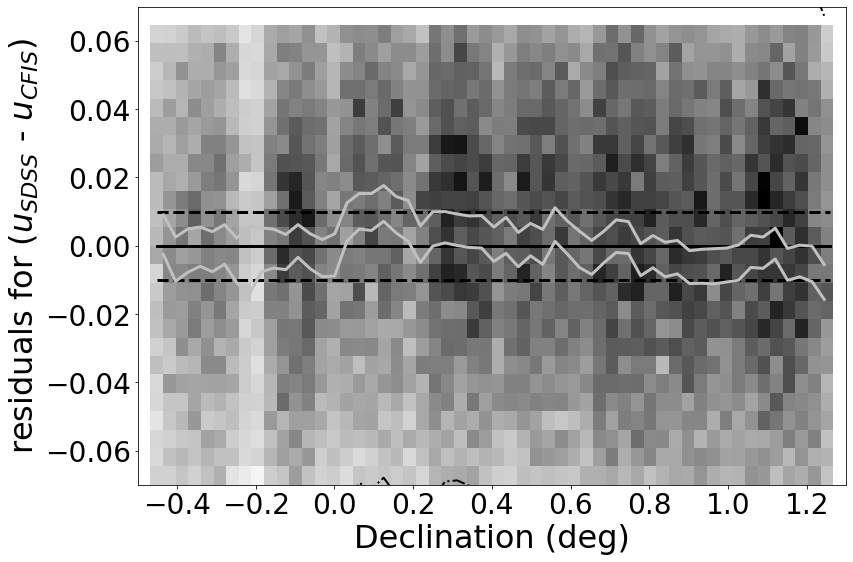

made plot colorResidCFISug_dra_Dec.png
-----------
 stats for SDSS u binning medians:
medianAll: 0.0007992000282683693 std.dev.All: 0.07736573526284037
N= 180910 min= -0.29999519999728347 max= 0.29992319982557064
median: 0.0011519999561642518 std.dev: 0.009553127108403999
saved plot as: colorResidCFISug_dra_umag.png


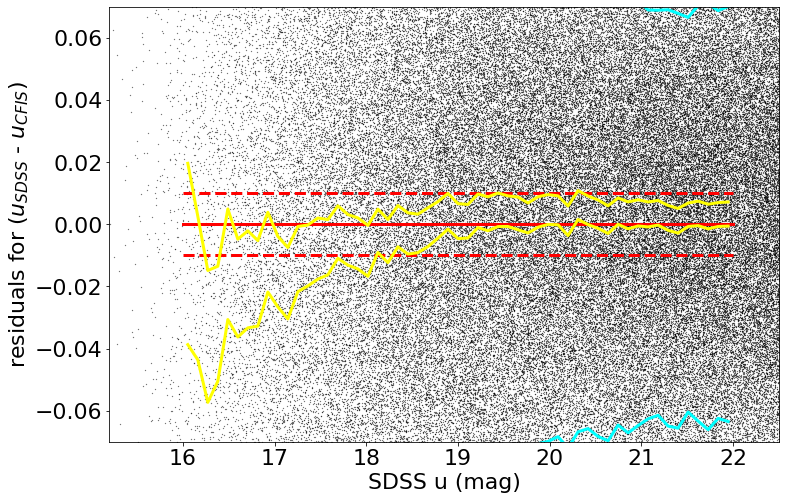

made plot colorResidCFISug_dra_umag.png
------------------------------------------------------------------
=========== WORKING ON: ddec ===================
 stats for RA binning medians:
medianAll: -0.00012960000000372673 std.dev.All: 0.06751162080018795
N= 182095 min= -0.29955600000008276 max= 0.29992320000013106
median: -0.002299499999916436 std.dev: 0.015988846126790007
saved plot as: colorResidCFISug_ddec_RA.png


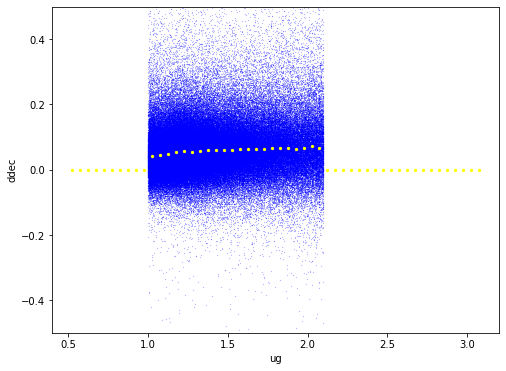

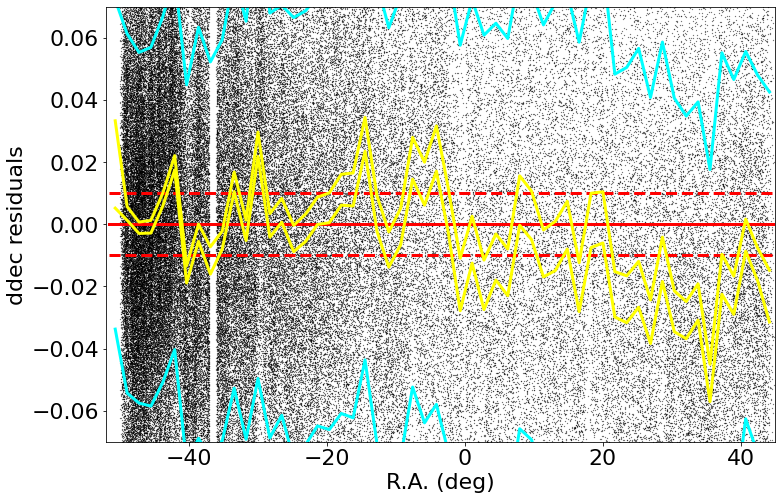

made plot colorResidCFISug_ddec_RA.png
-----------
 stats for Dec binning medians:
medianAll: -0.00012960000000372673 std.dev.All: 0.06751162080018795
N= 182095 min= -0.29955600000008276 max= 0.29992320000013106
median: 0.000822600000002862 std.dev: 0.00758640527394089
saved plot as: colorResidCFISug_ddec_Dec.png


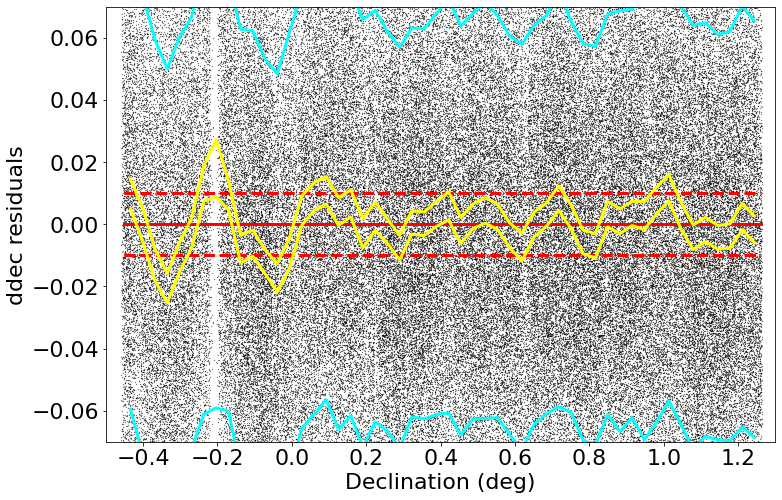

medianAll: 0.0006480000000698566 std.dev.All: 0.06874271820007806
N= 184422 min= -1.0203984000000776 max= 0.9325079999998923
median: 0.0014256000000345027 std.dev: 0.00766932543189476
saved plot as: colorResidCFISug_Dec_Hess.png


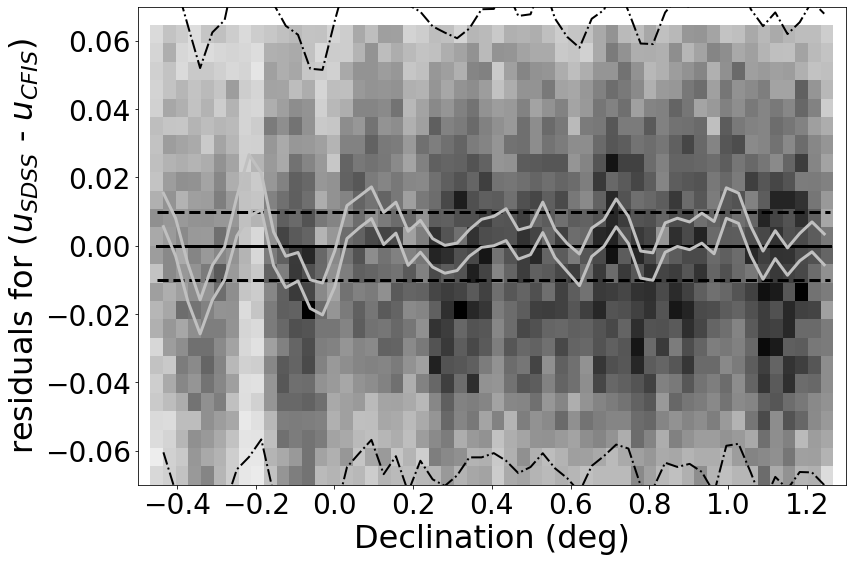

made plot colorResidCFISug_ddec_Dec.png
-----------
 stats for SDSS u binning medians:
medianAll: -0.00012960000000372673 std.dev.All: 0.06751162080018795
N= 182095 min= -0.29955600000008276 max= 0.29992320000013106
median: 0.003546000000626548 std.dev: 0.0042032885225805885
saved plot as: colorResidCFISug_ddec_umag.png


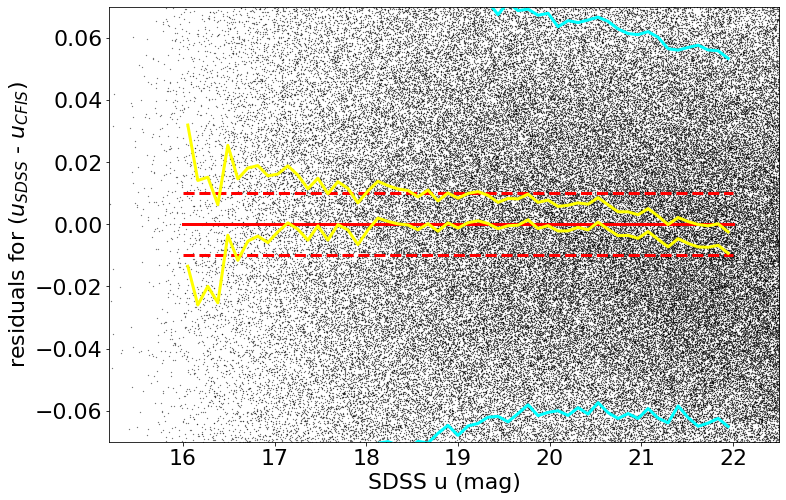

made plot colorResidCFISug_ddec_umag.png
------------------------------------------------------------------


In [15]:
keywords = {"Xstr":'ug', "plotNameRoot":'colorResidCFISug_', "symbSize":0.05}
for color in ('dupsf', 'duauto', 'dra', 'ddec'):
    keywords["Ystr"] = color 
    doOneColor(sdssCFISug, keywords)

=========== WORKING ON: dupsf ===================
 stats for RA binning medians:
medianAll: 0.0010800000000012744 std.dev.All: 0.04526028000000252
N= 179030 min= -0.29999999999999893 max= 0.2999200000000026
median: -0.00486000000000094 std.dev: 0.016763841600423386
saved plot as: colorResidCFISug_dupsf_RA.png


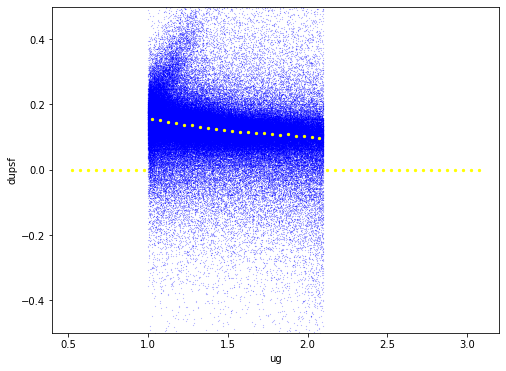

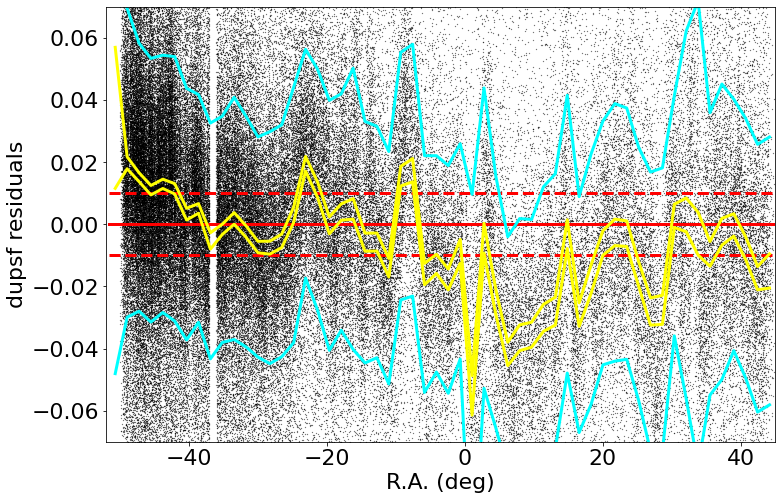

made plot colorResidCFISug_dupsf_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.0010800000000012744 std.dev.All: 0.04526028000000252
N= 179030 min= -0.29999999999999893 max= 0.2999200000000026
median: -4.500000000171728e-05 std.dev: 0.005658799279224225
saved plot as: colorResidCFISug_dupsf_Dec.png


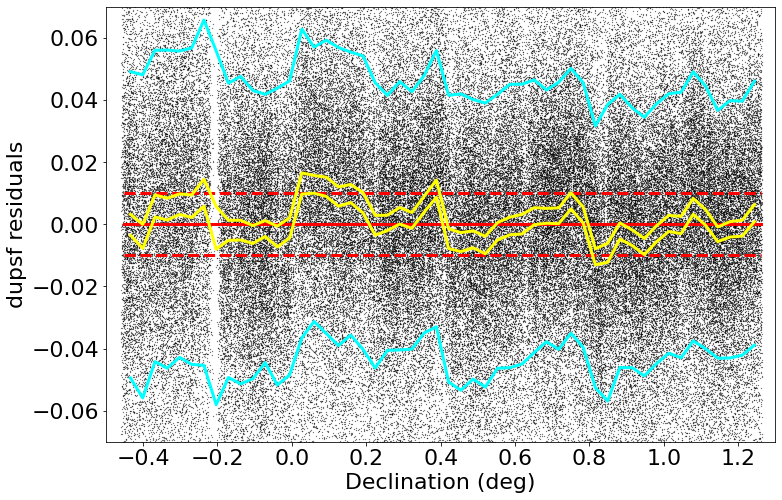

medianAll: 0.0010599999999977225 std.dev.All: 0.047246160000000134
N= 184422 min= -4.185480000000002 max= 2.271759999999999
median: 0.0007399999999996368 std.dev: 0.005964395378528205
saved plot as: colorResidCFISug_Dec_Hess.png


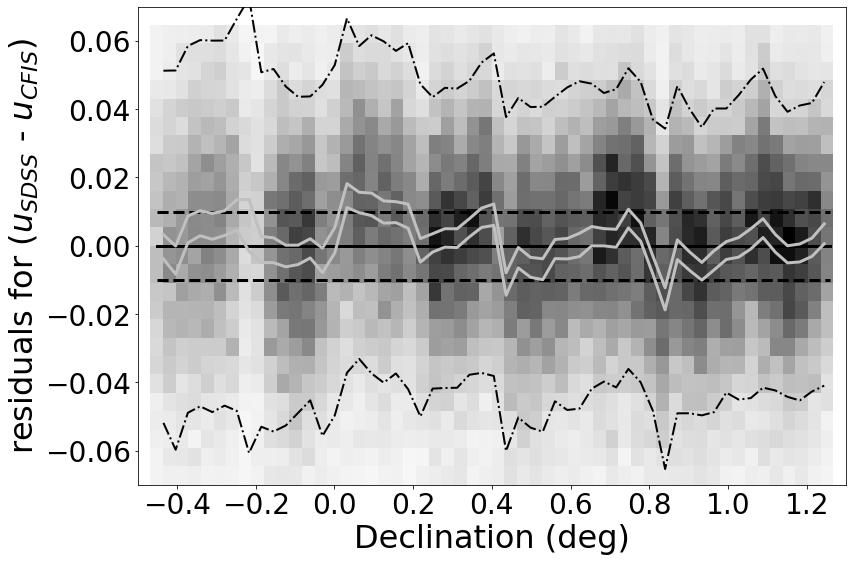

made plot colorResidCFISug_dupsf_Dec.png
-----------
 stats for SDSS u binning medians:
medianAll: 0.0010800000000012744 std.dev.All: 0.04526028000000252
N= 179030 min= -0.29999999999999893 max= 0.2999200000000026
median: 0.004180000000000184 std.dev: 0.009610158468262967
saved plot as: colorResidCFISug_dupsf_umag.png


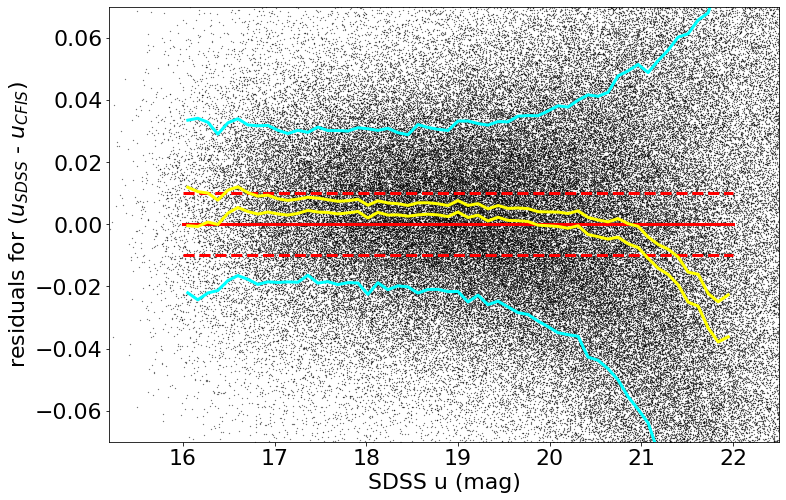

made plot colorResidCFISug_dupsf_umag.png
------------------------------------------------------------------


In [16]:
keywords = {"Xstr":'ug', "plotNameRoot":'colorResidCFISug_', "symbSize":0.05}
color = 'dupsf' 
keywords["Ystr"] = color 
doOneColor(sdssCFISug, keywords)

=========== WORKING ON: dupsf ===================
 stats for RA binning medians:
medianAll: 0.0011600000000029642 std.dev.All: 0.03859127999999658
N= 149525 min= -0.29979999999999907 max= 0.29996000000000156
median: -0.004559999999999766 std.dev: 0.01667921749188435
saved plot as: colorResidCFISbright_dupsf_RA.png


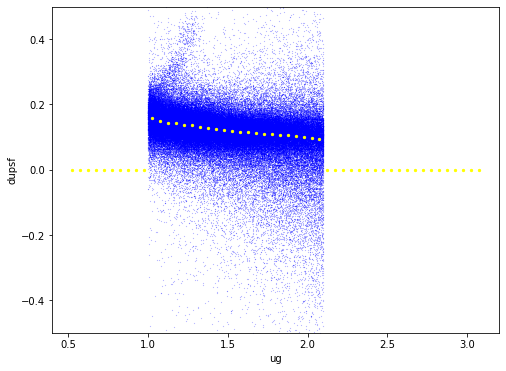

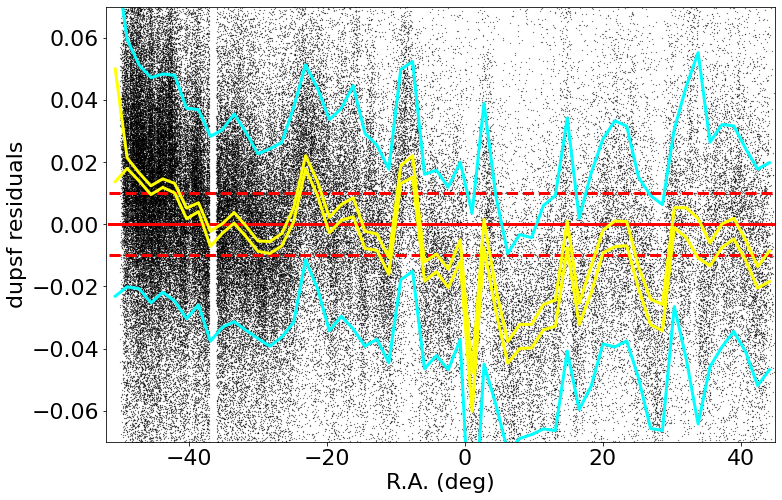

made plot colorResidCFISbright_dupsf_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.0011600000000029642 std.dev.All: 0.03859127999999658
N= 149525 min= -0.29979999999999907 max= 0.29996000000000156
median: 0.0004450000000008232 std.dev: 0.005270147098875932
saved plot as: colorResidCFISbright_dupsf_Dec.png


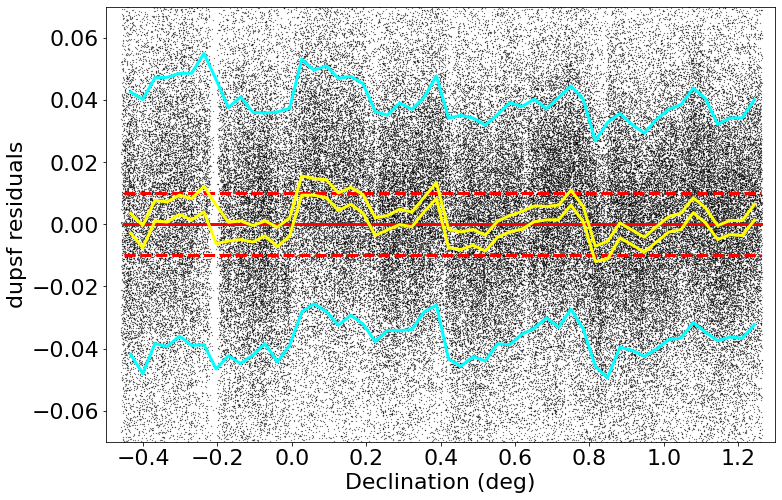

medianAll: 0.0010599999999977225 std.dev.All: 0.047246160000000134
N= 184422 min= -4.185480000000002 max= 2.271759999999999
median: 0.0007399999999996368 std.dev: 0.005964395378528205
saved plot as: colorResidCFISug_Dec_Hess.png


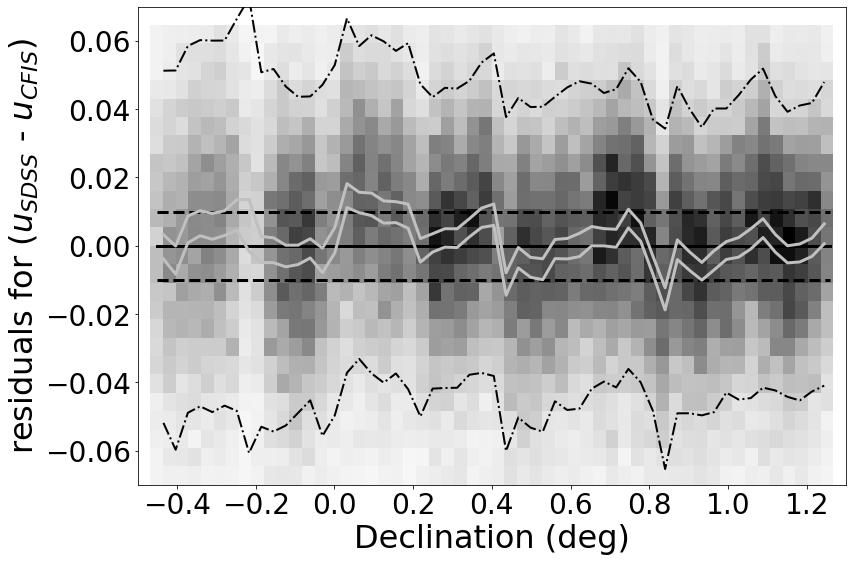

made plot colorResidCFISbright_dupsf_Dec.png
-----------
 stats for SDSS u binning medians:
medianAll: 0.0011600000000029642 std.dev.All: 0.03859127999999658
N= 149525 min= -0.29979999999999907 max= 0.29996000000000156
median: 0.004920000000002742 std.dev: 0.013909735773524029
saved plot as: colorResidCFISbright_dupsf_umag.png


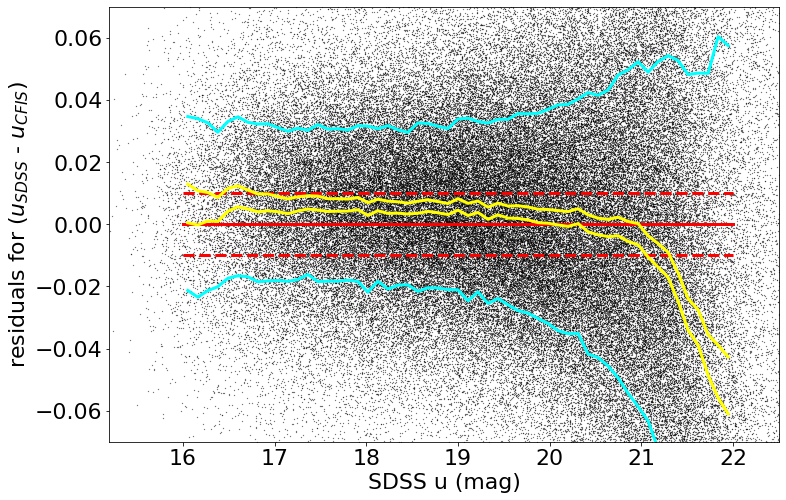

made plot colorResidCFISbright_dupsf_umag.png
------------------------------------------------------------------
=========== WORKING ON: duauto ===================
 stats for RA binning medians:
medianAll: 0.0012239999999992535 std.dev.All: 0.04348928999999799
N= 148602 min= -0.2999240000000009 max= 0.2998050000000011
median: -0.002625749999999521 std.dev: 0.01545800284042965
saved plot as: colorResidCFISbright_duauto_RA.png


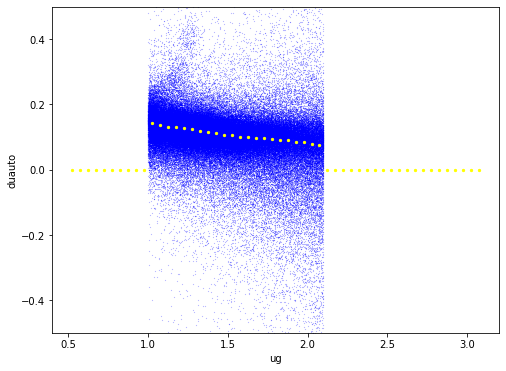

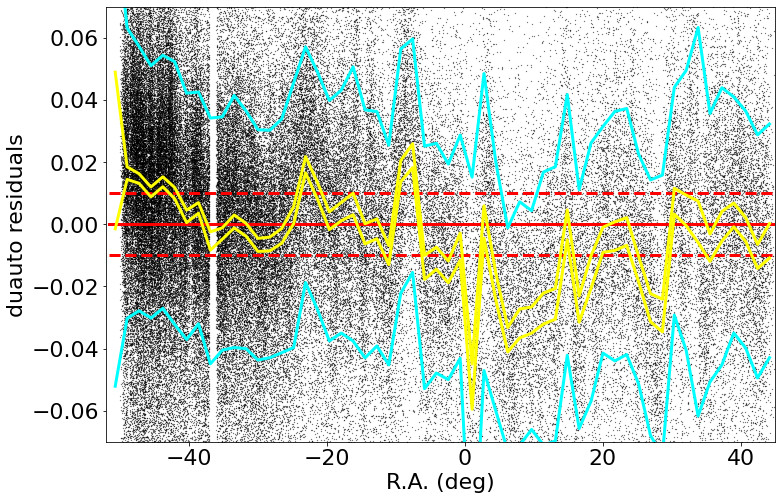

made plot colorResidCFISbright_duauto_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.0012239999999992535 std.dev.All: 0.04348928999999799
N= 148602 min= -0.2999240000000009 max= 0.2998050000000011
median: 0.0011812499999992732 std.dev: 0.004977989633072628
saved plot as: colorResidCFISbright_duauto_Dec.png


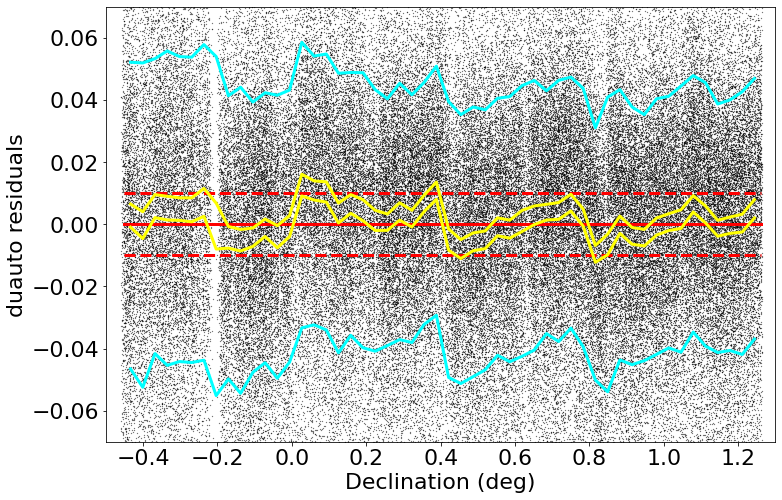

medianAll: 0.0010599999999977225 std.dev.All: 0.047246160000000134
N= 184422 min= -4.185480000000002 max= 2.271759999999999
median: 0.0007399999999996368 std.dev: 0.005964395378528205
saved plot as: colorResidCFISug_Dec_Hess.png


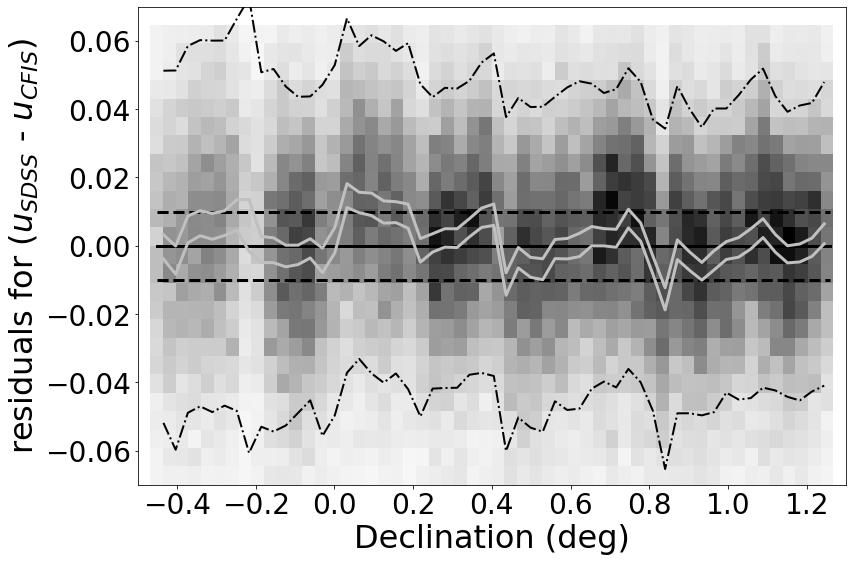

made plot colorResidCFISbright_duauto_Dec.png
-----------
 stats for SDSS u binning medians:
medianAll: 0.0012239999999992535 std.dev.All: 0.04348928999999799
N= 148602 min= -0.2999240000000009 max= 0.2998050000000011
median: 0.006295999999998636 std.dev: 0.02059834745952455
saved plot as: colorResidCFISbright_duauto_umag.png


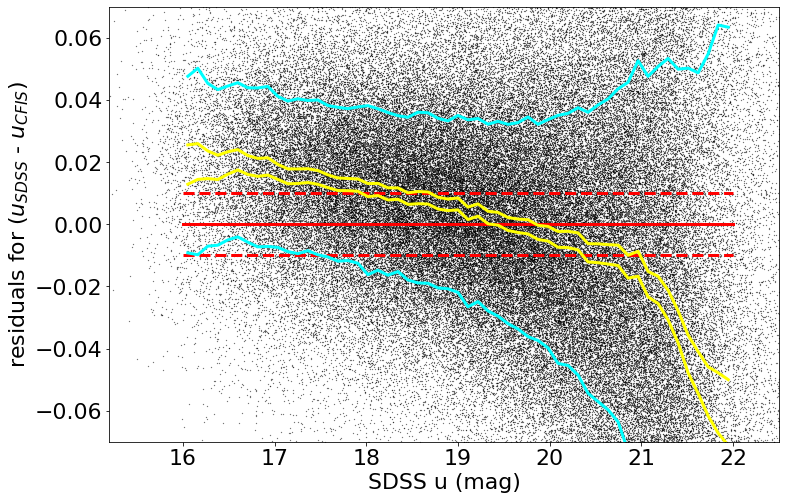

made plot colorResidCFISbright_duauto_umag.png
------------------------------------------------------------------
=========== WORKING ON: dra ===================
 stats for RA binning medians:
medianAll: 0.0009719999883373029 std.dev.All: 0.08119507505041305
N= 148271 min= -0.29995200004947264 max= 0.2999447999383733
median: -0.020726999997293667 std.dev: 0.02562934372636943
saved plot as: colorResidCFISbright_dra_RA.png


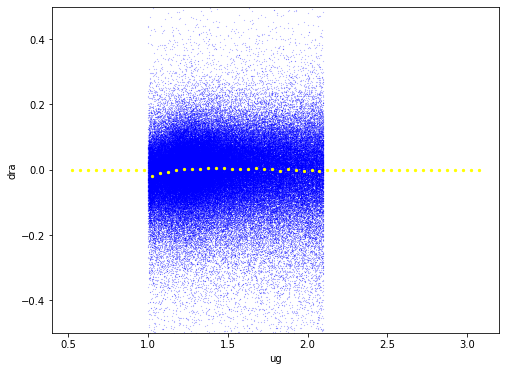

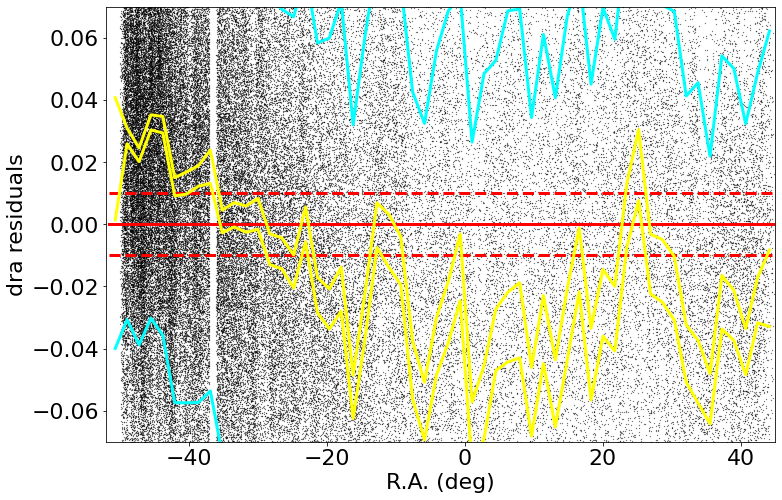

made plot colorResidCFISbright_dra_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.0009719999883373029 std.dev.All: 0.08119507505041305
N= 148271 min= -0.29995200004947264 max= 0.2999447999383733
median: 0.0007685999291098674 std.dev: 0.005050104057070344
saved plot as: colorResidCFISbright_dra_Dec.png


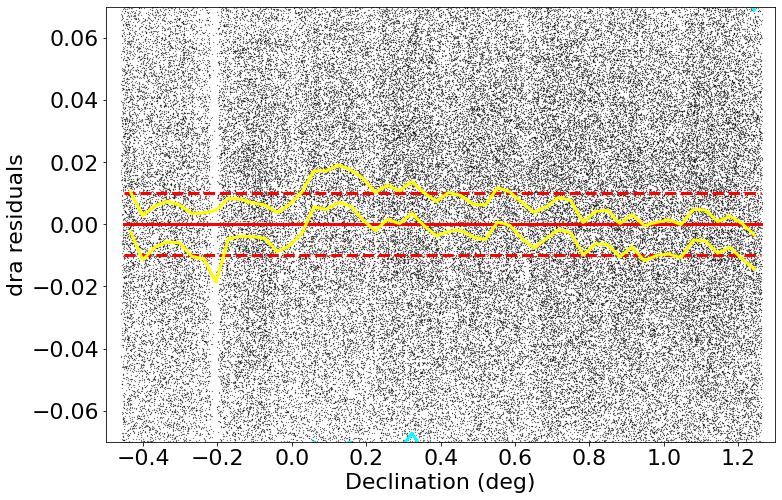

medianAll: 0.0010599999999977225 std.dev.All: 0.047246160000000134
N= 184422 min= -4.185480000000002 max= 2.271759999999999
median: 0.0007399999999996368 std.dev: 0.005964395378528205
saved plot as: colorResidCFISug_Dec_Hess.png


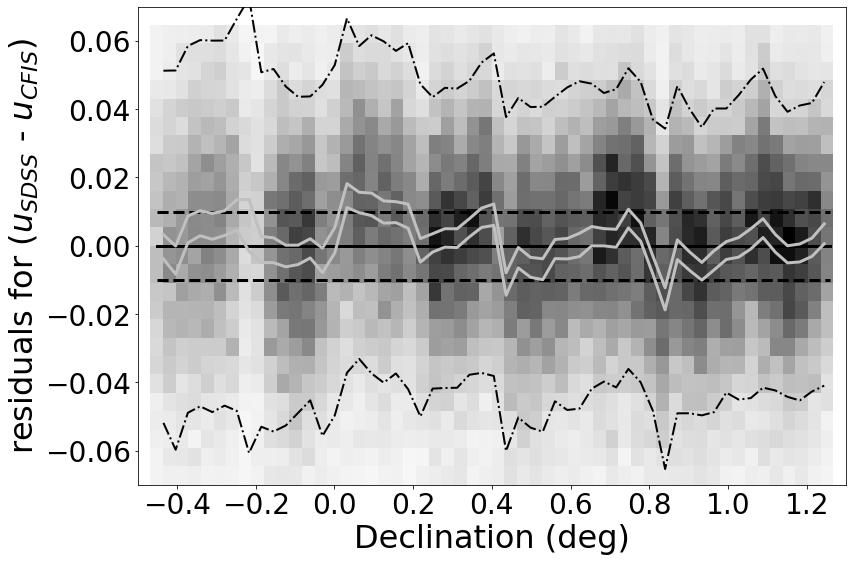

made plot colorResidCFISbright_dra_Dec.png
-----------
 stats for SDSS u binning medians:
medianAll: 0.0009719999883373029 std.dev.All: 0.08119507505041305
N= 148271 min= -0.29995200004947264 max= 0.2999447999383733
median: 0.0007812000659157305 std.dev: 0.00978270846573586
saved plot as: colorResidCFISbright_dra_umag.png


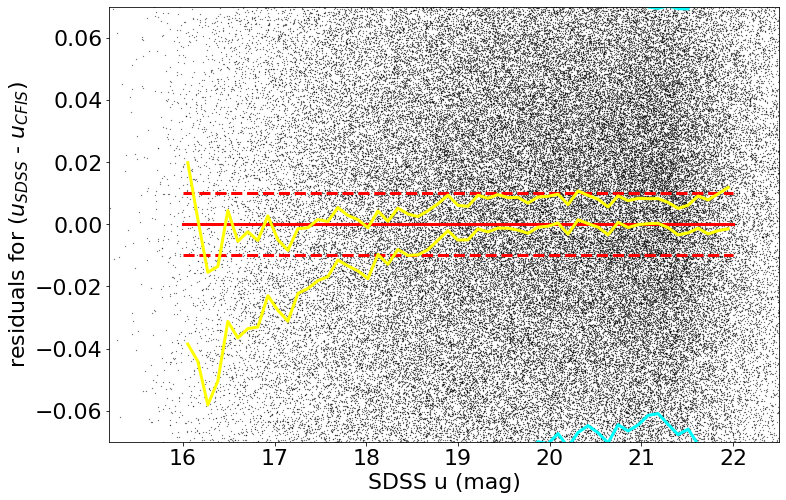

made plot colorResidCFISbright_dra_umag.png
------------------------------------------------------------------
=========== WORKING ON: ddec ===================
 stats for RA binning medians:
medianAll: -0.00030239999998769515 std.dev.All: 0.06970705559980059
N= 149426 min= -0.2995415999999684 max= 0.29999519999999846
median: -0.002667599999963426 std.dev: 0.016417244716534534
saved plot as: colorResidCFISbright_ddec_RA.png


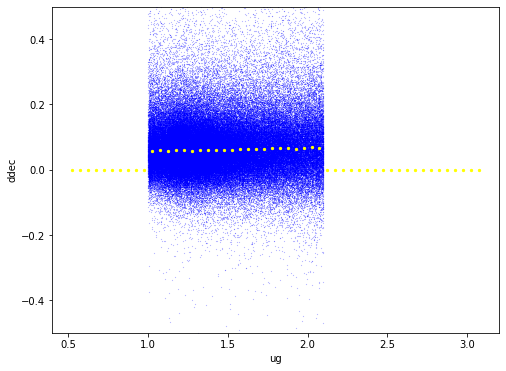

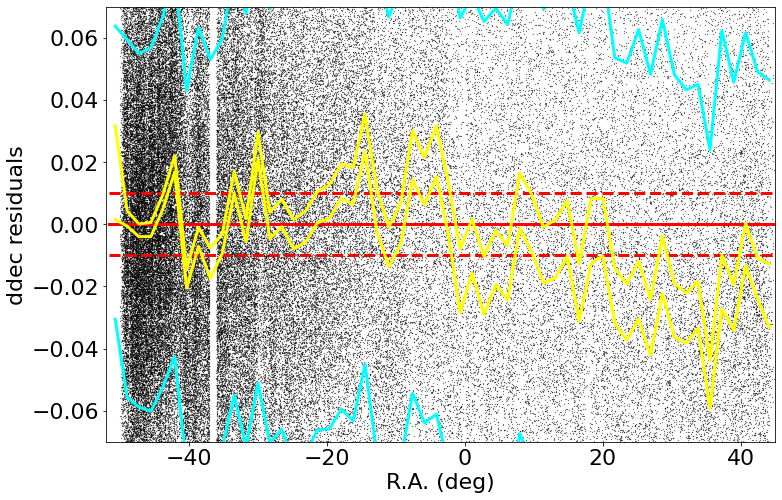

made plot colorResidCFISbright_ddec_RA.png
-----------
 stats for Dec binning medians:
medianAll: -0.00030239999998769515 std.dev.All: 0.06970705559980059
N= 149426 min= -0.2995415999999684 max= 0.29999519999999846
median: 0.00048600000003606175 std.dev: 0.007933809693657125
saved plot as: colorResidCFISbright_ddec_Dec.png


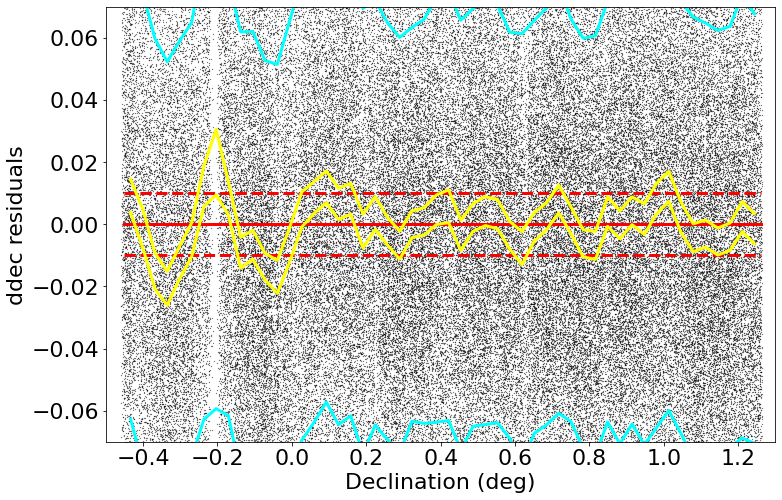

medianAll: 0.0010599999999977225 std.dev.All: 0.047246160000000134
N= 184422 min= -4.185480000000002 max= 2.271759999999999
median: 0.0007399999999996368 std.dev: 0.005964395378528205
saved plot as: colorResidCFISug_Dec_Hess.png


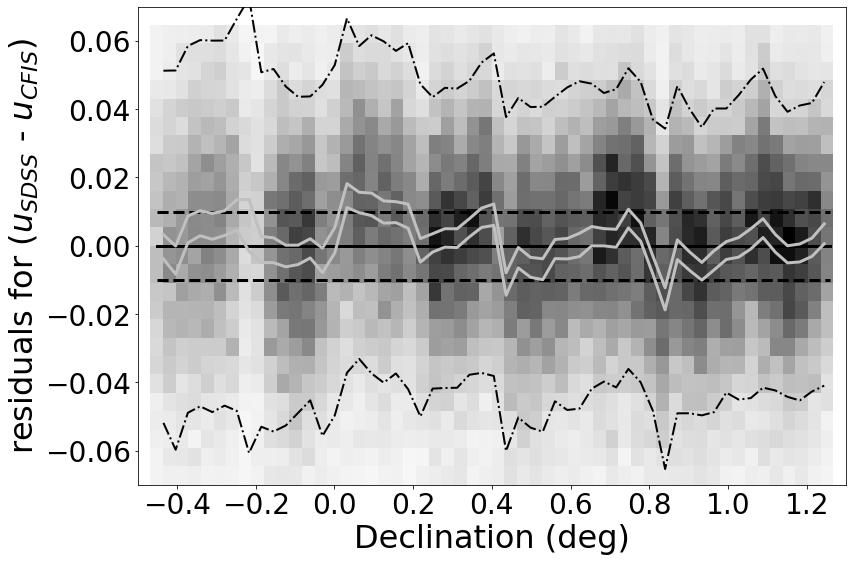

made plot colorResidCFISbright_ddec_Dec.png
-----------
 stats for SDSS u binning medians:
medianAll: -0.00030239999998769515 std.dev.All: 0.06970705559980059
N= 149426 min= -0.2995415999999684 max= 0.29999519999999846
median: 0.00026639999988601476 std.dev: 0.004218941699197932
saved plot as: colorResidCFISbright_ddec_umag.png


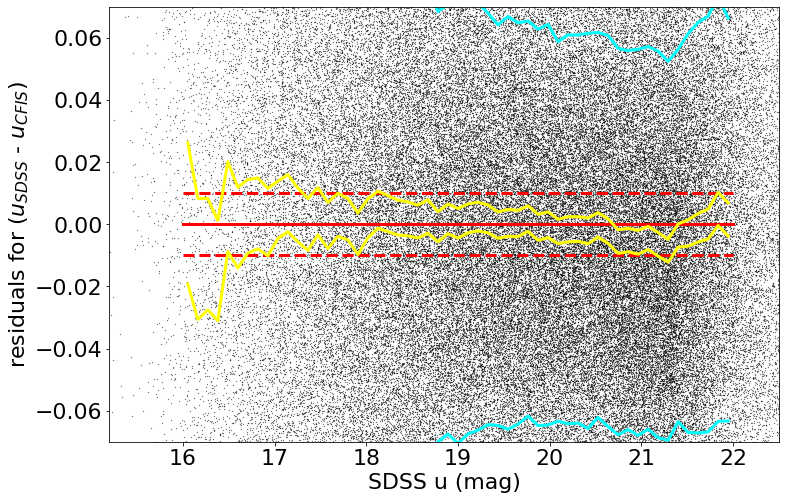

made plot colorResidCFISbright_ddec_umag.png
------------------------------------------------------------------


In [17]:
keywords = {"Xstr":'ug', "plotNameRoot":'colorResidCFISbright_', "symbSize":0.05}
for color in ('dupsf', 'duauto', 'dra', 'ddec'):
    keywords["Ystr"] = color 
    doOneColor(sdssCFISbright, keywords)

medianAll: -0.013999999999999346 std.dev.All: 0.017784000000000674
N= 151599 min= -1.9678000000000004 max= 3.6235
median: -0.01120000000000232 std.dev: 0.01044733965108435
saved plot as: colorResidCFISbright_CFISupsfVSuauto.png


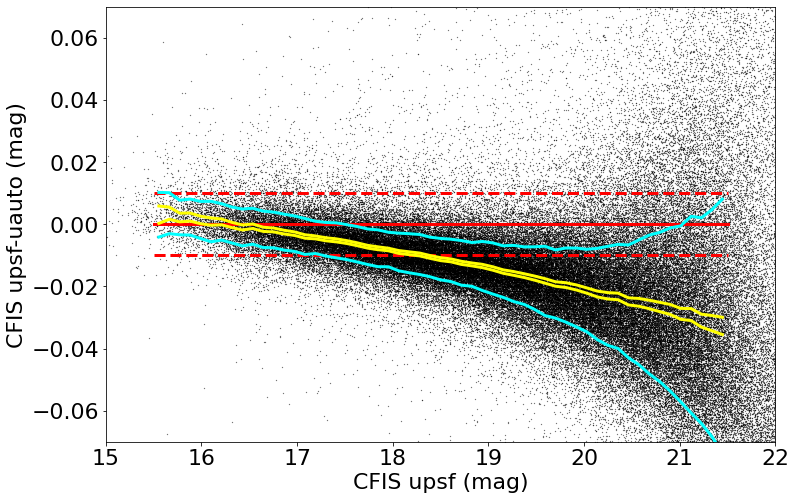

In [18]:
plotName = 'colorResidCFISbright_CFISupsfVSuauto.png' 
Ylabel = 'CFIS upsf-uauto (mag)'
kwOC = {"Xstr":'upsf', "Xmin":15, "Xmax":22, "Xlabel":'CFIS upsf (mag)', \
          "Ystr":'duCFIS', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":15.5, "XmaxBin":21.5, "nBin":55, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":0.05}
zit.plotdelMag(sdssCFISbright, kwOC)

=========== WORKING ON: dupsf ===================
 stats for RA binning medians:
medianAll: 0.0011600000000029642 std.dev.All: 0.03859127999999658
N= 149525 min= -0.29979999999999907 max= 0.29996000000000156
median: -0.004739999999998502 std.dev: 0.015911861911473292
-0.04554965390976131 0.06152574369839755 0.02901115353914475
saved plot as: colorResidCFIS_Gaia_dupsf_RA.png


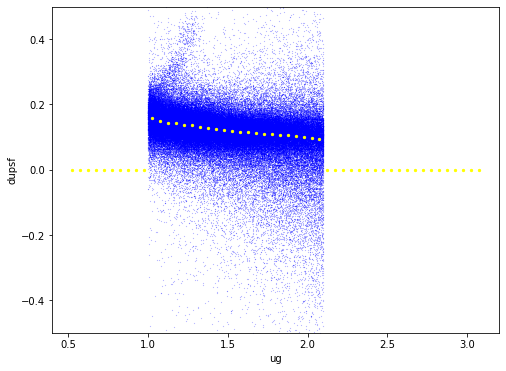

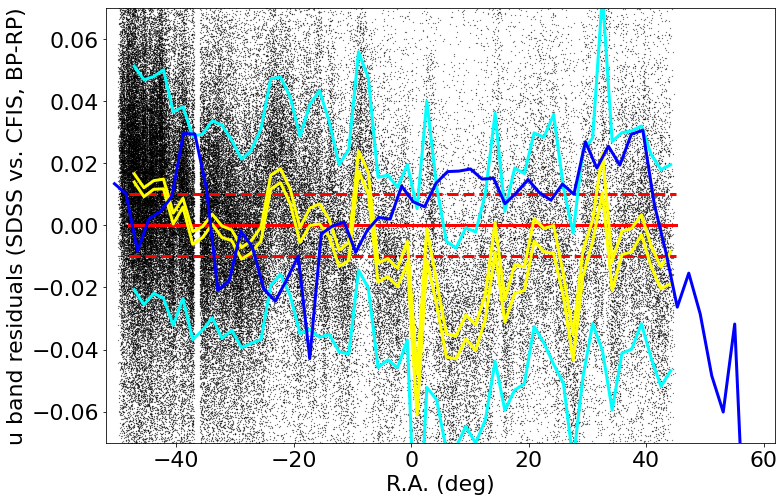

made plot colorResidCFIS_Gaia_dupsf_RA.png


In [19]:
keywords = {"Xstr":'ug', "plotNameRoot":'colorResidCFIS_Gaia_', "symbSize":0.05}
keywords["Ystr"] = 'dupsf' 
doOneColorRA(sdssCFISbright, keywords)

=========== WORKING ON: dupsf ===================
-----------
 stats for Dec binning medians:
medianAll: 0.0011600000000029642 std.dev.All: 0.03859127999999658
N= 149525 min= -0.29979999999999907 max= 0.29996000000000156
median: 0.0011200000000003846 std.dev: 0.005129157069625927
-0.026036096540180246 0.01395345321966331 0.015868813587371657
saved plot as: colorResidCFIS_Gaia_dupsf_Dec.png


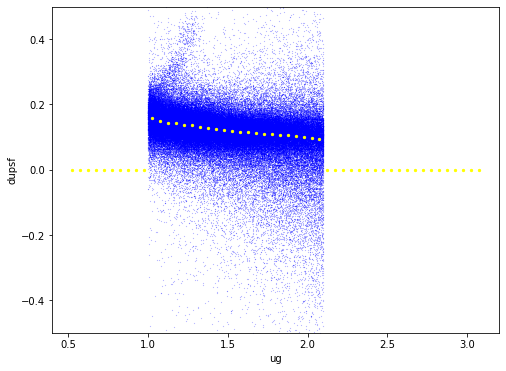

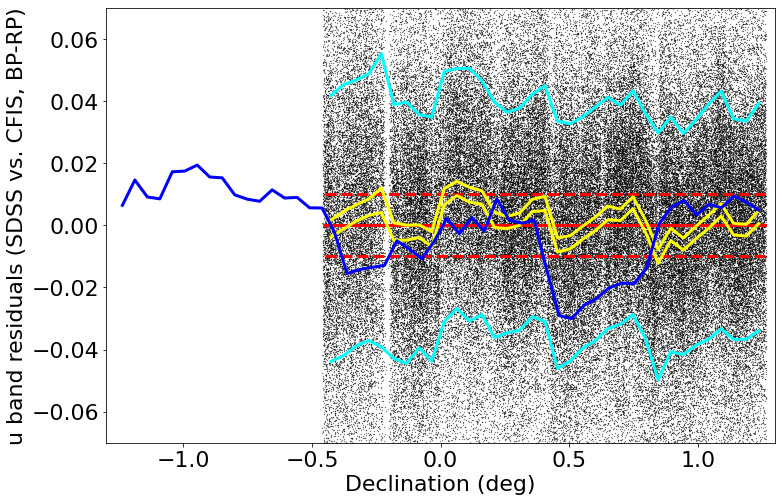

made plot colorResidCFIS_Gaia_dupsf_Dec.png


In [20]:
keywords = {"Xstr":'ug', "plotNameRoot":'colorResidCFIS_Gaia_', "symbSize":0.05}
keywords["Ystr"] = 'dupsf' 
doOneColorDec(sdssCFISbright, keywords)

In [21]:
sdssCFIS

ra_cfis,dec_cfis,upsf,uauto,upsfErr,uautoErr,sg,calib_fla,ra_sdss,dec_sdss,raRMS,decRMS,nEpochs,AR_val,u_Nobs,u_mMed,u_mMean,u_mErr,u_rms_scatt,u_chi2,g_Nobs,g_mMed,g_mMean,g_mErr,g_rms_scatt,g_chi2,r_Nobs,r_mMed,r_mMean,r_mErr,r_rms_scatt,r_chi2,i_Nobs,i_mMed,i_mMean,i_mErr,i_rms_scatt,i_chi2,z_Nobs,z_mMed,z_mMean,z_mErr,z_rms_scatt,z_chi2,sep_2d_arcsec,dra,ddec,raW,dupsf,duauto,ug,gr,ri,gi,iz,ra,dec,duCFIS
float64,float64,float64,float64,float64,float64,float64,str18,float64,float64,float64,float64,int64,float64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
0.2005306,-0.4553149,20.66,20.7413,0.008,0.0214,0.9365940018085198,CALIBSTARS_0674245,0.200528,-0.455284,0.0145,0.0145,21,0.115,20,20.69,20.682,0.017,0.062,0.844,21,19.127,19.126,0.005,0.014,0.589,20,18.51,18.511,0.004,0.011,0.57,21,18.278,18.276,0.004,0.018,0.87,21,18.151,18.155,0.006,0.034,1.196,0.11163306708987465,-0.009359999999969393,0.11124000000000134,0.200528,0.030000000000001137,-0.05129999999999768,1.5630000000000024,0.6169999999999973,0.23200000000000287,0.8490000000000002,0.1269999999999989,0.200528,-0.455284,-0.08129999999999882
0.2437635,-0.4533631,18.244,18.2533,0.002,0.0039,1.0109549762986287,CALIBSTARS_0674274,0.243691,-0.453431,0.0165,0.0165,22,0.11,21,18.389,18.389,0.005,0.027,1.091,21,17.406,17.402,0.004,0.016,0.667,21,17.038,17.041,0.004,0.016,1.02,21,16.902,16.902,0.004,0.01,0.633,20,16.856,16.855,0.004,0.014,0.673,0.35758586096395434,-0.2610000000000112,-0.2444399999998348,0.243691,0.14499999999999957,0.13569999999999993,0.9830000000000005,0.36799999999999855,0.13599999999999923,0.5039999999999978,0.045999999999999375,0.243691,-0.453431,-0.009299999999999642
0.1809341,-0.4533125,22.131,22.1961,0.027,0.1129,1.027597643251985,CALIBSTARS_0675251,0.18095,-0.453341,0.0409,0.0409,21,0.115,11,22.296,22.225,0.071,0.192,0.732,21,21.685,21.72,0.016,0.085,0.941,21,20.798,20.797,0.01,0.039,0.795,21,20.489,20.51,0.011,0.059,1.278,18,20.123,20.136,0.029,0.114,0.936,0.11748605235926918,0.05724000000004725,-0.10259999999995273,0.18095,0.16499999999999915,0.0998999999999981,0.6110000000000007,0.8870000000000005,0.3089999999999975,1.195999999999998,0.36599999999999966,0.18095,-0.453341,-0.06510000000000105
0.1370043,-0.4446455,21.553,21.5585,0.016,0.0425,1.0619453684545863,CALIBSTARS_0674235,0.136951,-0.444659,0.0245,0.0245,22,0.112,19,21.733,21.673,0.038,0.21,1.26,22,20.435,20.437,0.007,0.029,0.91,22,19.802,19.795,0.005,0.037,1.375,22,19.525,19.526,0.006,0.022,0.772,22,19.341,19.347,0.014,0.104,1.52,0.19793351658543412,-0.19188000000002203,-0.048599999999998644,0.136951,0.17999999999999972,0.17450000000000188,1.2980000000000018,0.6329999999999991,0.277000000000001,0.9100000000000001,0.1839999999999975,0.136951,-0.444659,-0.00549999999999784
0.218496,-0.4365168,19.078,19.0978,0.003,0.0066,1.0003319920034666,CALIBSTARS_0674287,0.218517,-0.436301,0.0418,0.0418,22,0.114,21,19.156,19.15,0.007,0.042,1.359,22,18.747,18.746,0.005,0.02,0.934,21,18.659,18.656,0.004,0.019,1.057,22,18.683,18.688,0.004,0.027,1.32,22,18.784,18.785,0.009,0.032,0.765,0.7805495261855515,0.07559999999997569,0.7768799999999576,0.218517,0.0779999999999994,0.05819999999999936,0.4089999999999989,0.08800000000000097,-0.02400000000000091,0.06400000000000006,-0.10099999999999909,0.218517,-0.436301,-0.01980000000000004
0.2084816,-0.4179115,19.465,19.4783,0.003,0.0088,0.9974991455370388,CALIBSTARS_0672259,0.208484,-0.417922,0.0262,0.0262,34,0.112,34,19.626,19.626,0.006,0.051,1.419,31,18.265,18.264,0.004,0.012,0.544,34,17.771,17.769,0.003,0.02,1.26,34,17.589,17.59,0.003,0.022,1.286,34,17.503,17.504,0.004,0.029,1.243,0.03877480662108562,0.008640000000048609,-0.03780000000008776,0.208484,0.16100000000000136,0.147700000000

(0.0, 0.2)

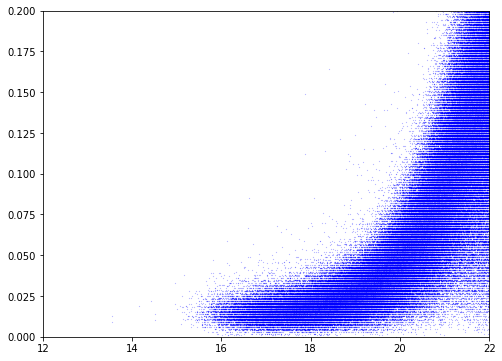

In [22]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
ax.scatter(sdssCFIS['u_mMed'], sdssCFIS['u_rms_scatt'], s=0.01, c='blue')
ax.set_xlim(12,22)
ax.set_ylim(0.0,0.2)

In [23]:
sdss

calib_fla,ra,dec,raRMS,decRMS,nEpochs,AR_val,u_Nobs,u_mMed,u_mMean,u_mErr,u_rms_scatt,u_chi2,g_Nobs,g_mMed,g_mMean,g_mErr,g_rms_scatt,g_chi2,r_Nobs,r_mMed,r_mMean,r_mErr,r_rms_scatt,r_chi2,i_Nobs,i_mMed,i_mMean,i_mErr,i_rms_scatt,i_chi2,z_Nobs,z_mMed,z_mMean,z_mErr,z_rms_scatt,z_chi2
str18,float64,float64,float64,float64,int64,float64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64
CALIBSTARS_0000001,308.500219,-1.227713,0.0227,0.0227,7,0.587,3,23.877,23.83,0.611,0.06,0.056,6,22.388,22.269,0.05,0.154,1.554,7,20.833,20.835,0.017,0.056,1.05,7,20.173,20.207,0.015,0.046,1.105,7,19.906,19.824,0.04,0.116,1.212
CALIBSTARS_0000002,308.500072,-1.240266,0.0141,0.0141,7,0.596,4,21.978,21.974,0.093,0.045,0.225,7,20.488,20.462,0.014,0.042,1.116,7,19.764,19.77,0.011,0.052,0.299,7,19.538,19.509,0.013,0.032,0.808,7,19.444,19.391,0.034,0.095,0.824
CALIBSTARS_0000003,308.500101,-1.217158,0.0154,0.0154,7,0.579,7,19.4,19.391,0.012,0.021,0.625,6,17.976,17.976,0.005,0.008,0.566,7,17.319,17.318,0.004,0.008,0.889,7,17.057,17.055,0.005,0.027,1.752,6,16.879,16.88,0.007,0.004,0.215
CALIBSTARS_0000004,308.501912,-1.176494,0.0117,0.0117,7,0.559,7,20.61,20.603,0.028,0.081,0.852,6,18.457,18.46,0.006,0.007,0.428,7,17.551,17.557,0.005,0.022,0.797,6,17.203,17.194,0.006,0.007,0.496,7,16.973,16.971,0.009,0.022,0.653
CALIBSTARS_0000005,308.504615,-1.174191,0.04,0.04,7,0.556,2,23.96,23.99,0.634,0.103,0.114,5,23.084,23.022,0.097,0.133,0.542,7,21.3,21.328,0.025,0.06,0.992,7,20.352,20.336,0.016,0.061,1.381,7,19.866,19.752,0.036,0.168,1.733
CALIBSTARS_0000006,308.501254,-1.119302,0.0166,0.0166,8,0.537,3,22.444,22.462,0.275,0.123,0.126,7,20.104,20.1,0.013,0.008,0.118,8,19.142,19.128,0.007,0.022,0.561,7,18.77,18.768,0.009,0.01,0.146,8,18.519,18.509,0.015,0.016,0.403
CALIBSTARS_0000007,308.503096,-1.132302,0.0295,0.0295,8,0.543,6,19.344,19.341,0.012,0.009,0.257,7,17.81,17.807,0.005,0.008,0.689,8,17.159,17.162,0.004,0.012,0.962,7,16.912,16.915,0.004,0.005,0.334,8,16.761,16.759,0.006,0.012,0.673
CALIBSTARS_0000008,308.507505,-1.225594,0.0183,0.0183,7,0.575,7,19.548,19.558,0.013,0.043,1.258,7,18.077,18.071,0.005,0.014,1.124,7,17.453,17.454,0.004,0.007,0.586,7,17.227,17.225,0.005,0.011,0.737,7,17.092,17.084,0.007,0.018,0.793
CALIBSTARS_0000009,308.508754,-1.213904,0.0291,0.0291,7,0.565,7,19.176,19.17,0.011,0.021,0.711,6,17.707,17.708,0.004,0.008,0.643,7,17.087,17.087,0.004,0.004,0.394,7,16.836,16.838,0.005,0.018,1.296,7,16.684,16.684,0.007,0.019,0.989


(0.8, 3.0)

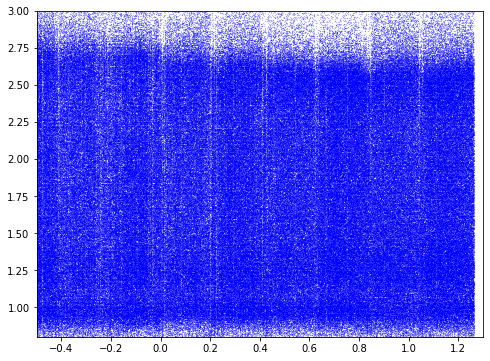

In [24]:
ug = sdss['u_mMed'] - sdss['g_mMed']
fig,ax = plt.subplots(1,1,figsize=(8,6))
ax.scatter(sdss['dec'], ug, s=0.01, c='blue')
ax.set_xlim(-0.5,1.3)
ax.set_ylim(0.8,3.0)

(0.8, 1.5)

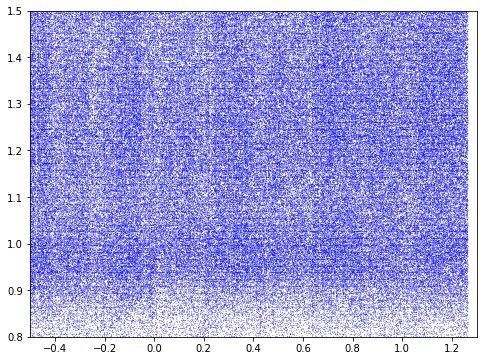

In [25]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
ax.scatter(sdss['dec'], ug, s=0.01, c='blue')
ax.set_xlim(-0.5,1.3)
ax.set_ylim(0.8,1.5)

(2.0, 2.8)

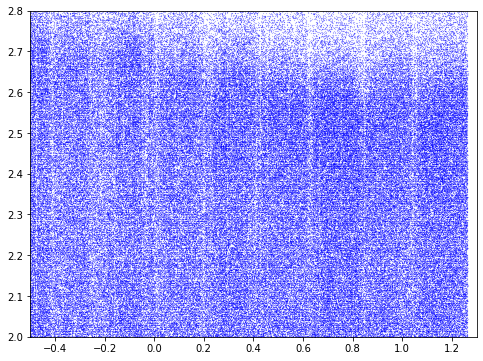

In [26]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
ax.scatter(sdss['dec'], ug, s=0.01, c='blue')
ax.set_xlim(-0.5,1.3)
ax.set_ylim(2.0,2.8)

(25.0, 12.8)

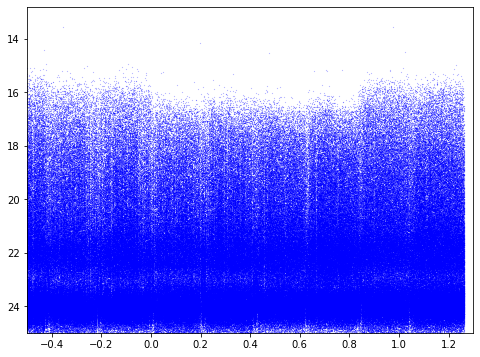

In [27]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
ax.scatter(sdss['dec'], sdss['u_mMed'], s=0.01, c='blue')
ax.set_xlim(-0.5,1.3)
ax.set_ylim(25.0,12.8)

In [28]:
sdss['ug'] = sdss['u_mMed'] - sdss['g_mMed']
sdss['gr'] = sdss['g_mMed'] - sdss['r_mMed']
sdssM = sdss[(sdss['ug']>2.2)&(sdss['ug']<3.0)&(sdss['gr']>1.3)&(sdss['gr']<1.6)]
# to Lovro: 2.2 < u-g < 3.0 and 1.3 < g-r < 1.6

Text(0, 0.5, 'u mag')

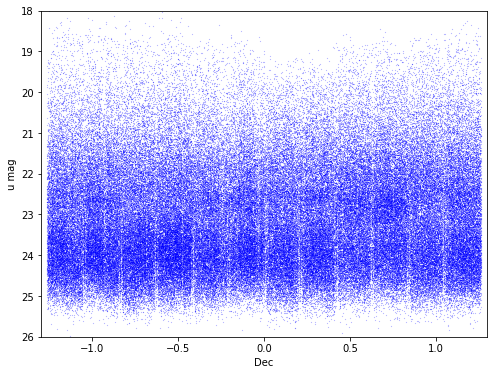

In [29]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
ax.scatter(sdssM['dec'], sdssM['u_mMed'], s=0.01, c='blue')
ax.set_xlim(-1.3,1.3)
ax.set_ylim(26.0,18)
ax.set_xlabel('Dec')
ax.set_ylabel('u mag')

Text(0, 0.5, 'umag Err')

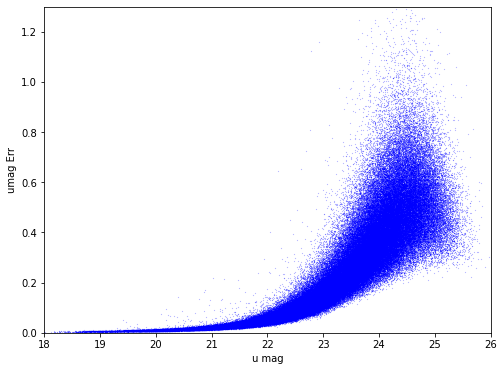

In [30]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
ax.scatter(sdssM['u_mMed'], sdssM['u_mErr'], s=0.01, c='blue')
ax.set_xlim(18, 26)
ax.set_ylim(0,1.3)

ax.set_xlabel('u mag')
ax.set_ylabel('umag Err')

In [31]:
# guarantee SNR>5 (i.e. magErr < 0.2)
sdssMbright = sdssM[(sdssM['u_mMed']>18)&(sdssM['u_mMed']<23)]

Text(0, 0.5, 'u-g')

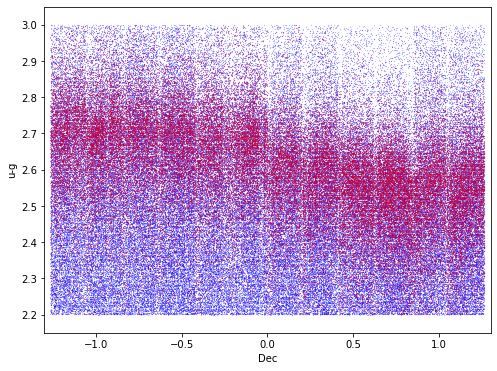

In [32]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
ax.scatter(sdssM['dec'], sdssM['ug'], s=0.01, c='blue')
ax.scatter(sdssMbright['dec'], sdssMbright['ug'], s=0.01, c='red')
ax.set_xlim(-1.3,1.3)
ax.set_ylim(2.15,3.05)
ax.set_xlabel('Dec')
ax.set_ylabel('u-g')

In [33]:
S123 = sdssMbright[(sdssMbright['dec']>-1.3)&(sdssMbright['dec']<0)]
S4 = sdssMbright[(sdssMbright['dec']>0)&(sdssMbright['dec']<0.4)]
S5 = sdssMbright[(sdssMbright['dec']>0.4)&(sdssMbright['dec']<0.8)]
S6 = sdssMbright[(sdssMbright['dec']>0.8)&(sdssMbright['dec']<1.3)]
S456 = sdssMbright[(sdssMbright['dec']>0.0)&(sdssMbright['dec']<1.3)]

In [34]:
sdssB = sdss[(sdss['ug']>0.8)&(sdss['ug']<2.5)&(sdss['gr']>0.2)&(sdss['gr']<1.0)]
sdssBbright = sdssB[(sdssB['u_mMed']>18)&(sdssB['u_mMed']<23)]
bS123 = sdssBbright[(sdssBbright['dec']>-1.3)&(sdssBbright['dec']<0)]
bS4 = sdssBbright[(sdssBbright['dec']>0)&(sdssBbright['dec']<0.4)]
bS5 = sdssBbright[(sdssBbright['dec']>0.4)&(sdssBbright['dec']<0.8)]
bS6 = sdssBbright[(sdssBbright['dec']>0.8)&(sdssBbright['dec']<1.3)]
bS456 = sdssBbright[(sdssBbright['dec']>0)&(sdssBbright['dec']<1.3)]

Text(0, 0.5, 'u-g')

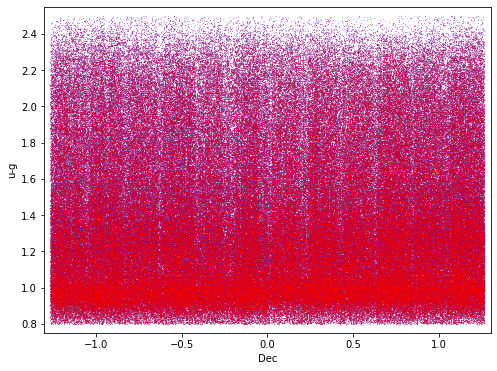

In [35]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
ax.scatter(sdssB['dec'], sdssB['ug'], s=0.01, c='blue')
ax.scatter(sdssBbright['dec'], sdssBbright['ug'], s=0.01, c='red')
ax.set_xlim(-1.3,1.3)
ax.set_ylim(0.75,2.55)
ax.set_xlabel('Dec')
ax.set_ylabel('u-g')

In [36]:
def qphist4(a1, a2, a3, a4, xMin, xMax, xLabel, verbose = False):
    ax = plt.axes()
    if (a1 != ''):
        hist(a1, bins='knuth', ax=ax, histtype='stepfilled', ec='k', fc='#AAAAAA')
    if (a2 != ''):
        hist(a2, bins='knuth', ax=ax, histtype='stepfilled', ec='b', fc='#AAAAAA')
    if (a3 != ''):
        hist(a3, bins='knuth', ax=ax, histtype='stepfilled', ec='g', fc='#AAAAAA')
    if (a4 != ''):
        hist(a4, bins='knuth', ax=ax, histtype='stepfilled', ec='r', fc='#AAAAAA')

    ax.set_xlabel(xLabel)
    ax.set_ylabel('n')
    ax.set_xlim(xMin, xMax)
    plt.show()
    if (verbose):
        print('Min, max: ', np.min(arr),np.max(arr)) 
        print('Mean, median: ', np.mean(arr),np.median(arr)) 
        print('sigG, st.dev.: ', sigG(arr),np.std(arr)) 
    return 

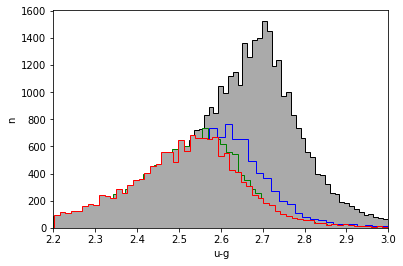

In [37]:
qphist4(S123['ug'], S4['ug'], S5['ug'], S6['ug'], 2.2, 3.0, 'u-g')

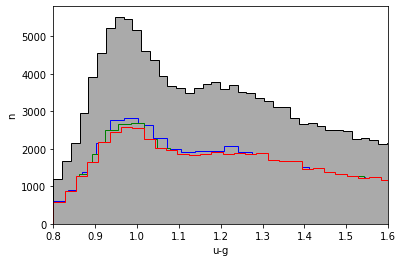

In [38]:
qphist4(bS123['ug'], bS4['ug'], bS5['ug'], bS6['ug'], 0.8, 1.6, 'u-g')

median: 2.6950000000000003 std.dev: 0.03764453627169647


Text(0, 0.5, 'u-g')

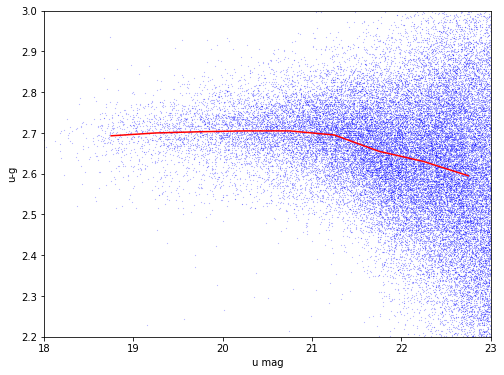

In [39]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
ax.scatter(S123['u_mMed'], S123['ug'], s=0.01, c='blue')
ax.set_xlim(18,23)
ax.set_ylim(2.2,3.0)
xBin, nPts, medianBin, sigGbin = zit.fitMedians(S123['u_mMed'], S123['ug'], 18.5, 23.0, 9)
ax.plot(xBin, medianBin, c='red')
ax.set_xlabel('u mag')
ax.set_ylabel('u-g')

median: 2.5820000000000007 std.dev: 0.03767993866472962


Text(0, 0.5, 'u-g')

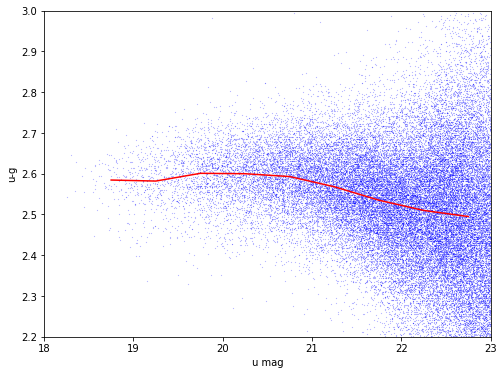

In [40]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
ax.scatter(S456['u_mMed'], S456['ug'], s=0.01, c='blue')
ax.set_xlim(18,23)
ax.set_ylim(2.2,3.0)
xBin, nPts, medianBin, sigGbin = zit.fitMedians(S456['u_mMed'], S456['ug'], 18.5, 23.0, 9)
ax.plot(xBin, medianBin, c='red')
ax.set_xlabel('u mag')
ax.set_ylabel('u-g')

In [41]:
sCb = sdssCFIS[sdssCFIS['u_mMed']<21]
sCbM = sCb[(sCb['ug']>2.2)&(sCb['ug']<3.0)&(sCb['gr']>1.3)&(sCb['gr']<1.6)]
print(np.size(sdssCFIS), np.size(sCb), np.size(sCbM))

324786 152711 6149


In [42]:
sCbM123 = sCbM[(sCbM['dec']>-1.3)&(sCbM['dec']<0)]
sCbM456 = sCbM[(sCbM['dec']>0)&(sCbM['dec']<1.3)]
print(np.size(sCbM123), np.size(sCbM456))

1231 4918


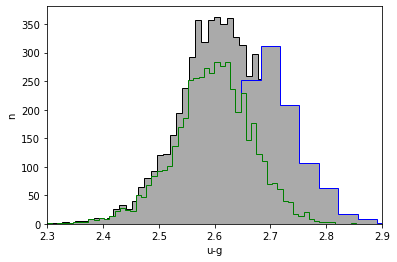

In [43]:
qphist4(sCbM['ug'], sCbM123['ug'], sCbM456['ug'], '', 2.3, 2.9, 'u-g')

In [44]:
np.median(sCbM123['dupsf'])

0.1750000000000007

In [45]:
np.median(sCbM456['dupsf'])

0.08000000000000185

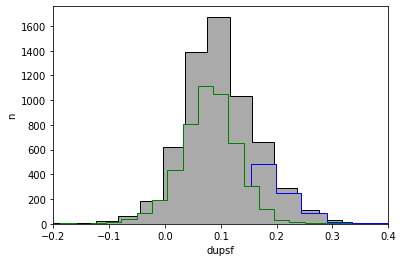

In [46]:
qphist4(sCbM['dupsf'], sCbM123['dupsf'], sCbM456['dupsf'], '', -0.2, 0.4, 'dupsf')

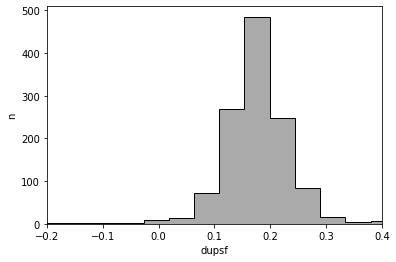

In [47]:
qphist4(sCbM123['dupsf'], '', '', '', -0.2, 0.4, 'dupsf')

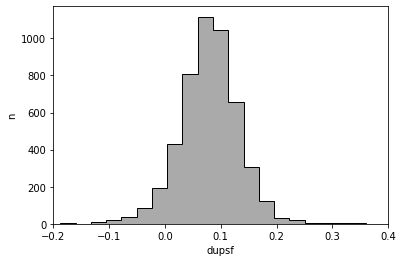

In [48]:
qphist4(sCbM456['dupsf'], '', '', '', -0.2, 0.4, 'dupsf')

In [49]:
sC = sdssCFIS[sdssCFIS['u_mMed']<23]
sCM = sC[(sC['ug']>2.2)&(sC['ug']<3.0)&(sC['gr']>1.3)&(sC['gr']<1.6)]
sCM123 = sCM[(sCM['dec']>-1.3)&(sCM['dec']<0)]
sCM456 = sCM[(sCM['dec']>0)&(sCM['dec']<1.3)]
print(np.size(sCM123), np.size(sCM456))

8666 31677


median: 2.6750000000000007 std.dev: 0.035301960215571235


Text(0, 0.5, 'u-g')

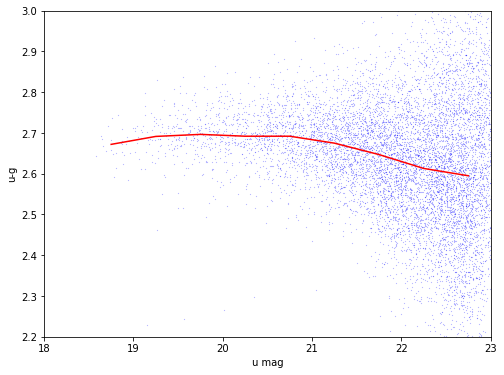

In [50]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
ax.scatter(sCM123['u_mMed'], sCM123['ug'], s=0.01, c='blue')
ax.set_xlim(18,23)
ax.set_ylim(2.2,3.0)
xBin, nPts, medianBin, sigGbin = zit.fitMedians(sCM123['u_mMed'], sCM123['ug'], 18.5, 23.0, 9)
ax.plot(xBin, medianBin, c='red')
ax.set_xlabel('u mag')
ax.set_ylabel('u-g')

median: 2.5919999999999987 std.dev: 0.03669090108217893


Text(0, 0.5, 'u-g')

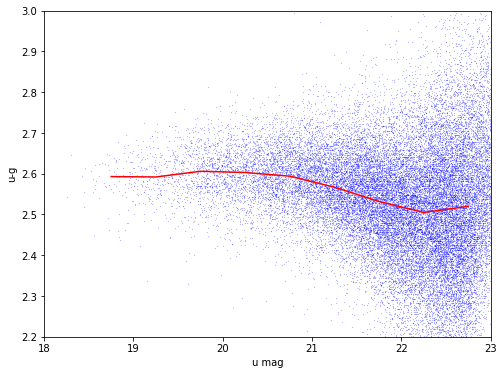

In [51]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
ax.scatter(sCM456['u_mMed'], sCM456['ug'], s=0.01, c='blue')
ax.set_xlim(18,23)
ax.set_ylim(2.2,3.0)
xBin, nPts, medianBin, sigGbin = zit.fitMedians(sCM456['u_mMed'], sCM456['ug'], 18.5, 23.0, 9)
ax.plot(xBin, medianBin, c='red')
ax.set_xlabel('u mag')
ax.set_ylabel('u-g')

median: 0.17100000000000115 std.dev: 0.017649537468146223


Text(0, 0.5, 'dupsf (SDSS-CFIS)')

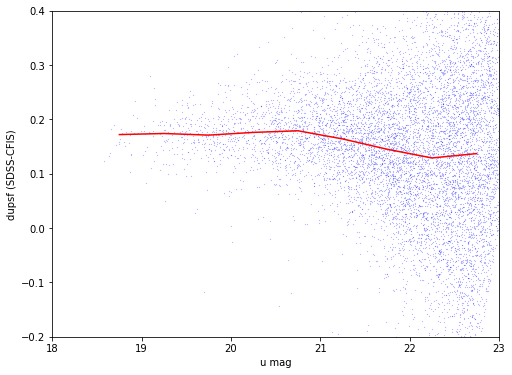

In [52]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
ax.scatter(sCM123['u_mMed'], sCM123['dupsf'], s=0.01, c='blue')
ax.set_xlim(18,23)
ax.set_ylim(-0.2,0.4)
xBin, nPts, medianBin, sigGbin = zit.fitMedians(sCM123['u_mMed'], sCM123['dupsf'], 18.5, 23.0, 9)
ax.plot(xBin, medianBin, c='red')
ax.set_xlabel('u mag')
ax.set_ylabel('dupsf (SDSS-CFIS)')

median: 0.07600000000000051 std.dev: 0.026799668322989065


Text(0, 0.5, 'dupsf (SDSS-CFIS)')

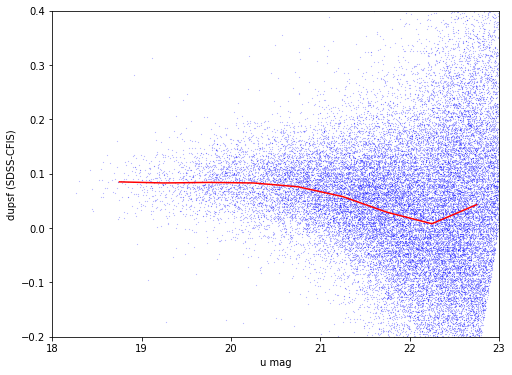

In [53]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
ax.scatter(sCM456['u_mMed'], sCM456['dupsf'], s=0.01, c='blue')
ax.set_xlim(18,23)
ax.set_ylim(-0.2,0.4)
xBin, nPts, medianBin, sigGbin = zit.fitMedians(sCM456['u_mMed'], sCM456['dupsf'], 18.5, 23.0, 9)
ax.plot(xBin, medianBin, c='red')
ax.set_xlabel('u mag')
ax.set_ylabel('dupsf (SDSS-CFIS)')

medianAll: 2.5909999999999975 std.dev.All: 0.14894100000000038
N= 76355 min= 2.200000000000003 max= 2.9990000000000023
median: 2.612499999999999 std.dev: 0.061680429587343544
saved plot as: Mdwarfs_ugVSdec.png


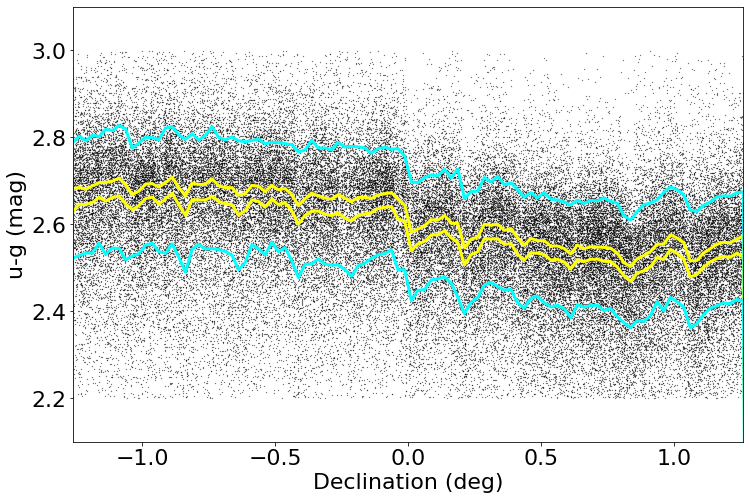

In [61]:
plotName = 'Mdwarfs_ugVSdec.png' 
Ylabel = 'u-g (mag)'
kwOC = {"Xstr":'dec', "Xmin":-1.26, "Xmax":1.26, "Xlabel":'Declination (deg)', \
          "Ystr":'ug', "Ymin":2.1, "Ymax":3.1, "Ylabel":Ylabel, \
          "XminBin":-1.3, "XmaxBin":1.3, "nBin":104, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":0.05}
zit.plotdelMag(sdssMbright, kwOC)

In [62]:
print(np.size(sdssMbright))

76355
